**Capstone Project Module 2: Data Analysis**

**Elisa Hariyanti - JCDS 0408-003**

---
# **Airbnb Listings Bangkok**

![airbnb-bangkok.png](airbnb-bangkok.png)

## **Latar Belakang**
---

Bangkok, ibu kota Thailand, telah lama dikenal sebagai destinasi wisata utama di dunia, menarik jutaan wisatawan setiap tahunnya. Keanekaragaman budaya, kehidupan malam yang semarak, kuliner yang beragam dan menggugah selera, serta warisan sejarah dan arsitektur yang kaya membuat Bangkok menjadi magnet bagi wisatawan internasional.

Airbnb merupakan *online platform* yang memungkinkan orang untuk menyewa atau menyewakan tempat tinggal mereka, seperti kamar, apartemen, rumah, dan akomodasi unik lainnya, kepada tamu dari seluruh dunia. Airbnb telah menjadi alternatif populer bagi wisatawan yang mencari pengalaman menginap yang lebih unik dan personal dibandingkan dengan hotel konvensional. Hal ini terutama menarik bagi wisatawan yang menginginkan akomodasi yang lebih terjangkau namun tetap nyaman dan strategis.

## **Pernyataan Masalah**

---

Meskipun Airbnb memberikan banyak keuntungan bagi wisatawan, tantangan muncul dalam hal pengelolaan dan optimalisasi listing untuk mencapai kepuasan pelanggan dan keuntungan maksimal. Tujuan dari analisis ini adalah untuk mengidentifikasi faktor-faktor kunci yang mempengaruhi harga, popularitas, dan ulasan dari pelanggan. Dengan pemahaman ini, host Airbnb dapat meningkatkan strategi mereka untuk menarik lebih banyak tamu, menetapkan harga yang kompetitif, dan meningkatkan layanan yang ditawarkan.

## **Data**
---

Untuk menjawab pertanyaan di atas, dilakukan analisis terhadap dataset Airbnb Listing di Bangkok yang telah disediakan. Untuk dataset tersebut dapat diakses [di sini.](https://drive.google.com/drive/folders/1A_KBMRFTS5Mthpp46nulso679ML4ZwTF)

In [2]:
# Import library yang dibutuhkan

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import normaltest

import warnings
warnings.filterwarnings("ignore")

In [3]:
# Membaca dataset Airbnb Listings Bangkok.csv

df_raw = pd.read_csv('Airbnb Listings Bangkok.csv')
print(f'Jumlah baris dan kolom: {df_raw.shape}')
display(df_raw.head(), df_raw.tail())

Jumlah baris dan kolom: (15854, 17)


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15849,15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15850,15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaN,NaN,14,365,0
15851,15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaN,NaN,14,365,0
15852,15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaN,NaN,14,365,0
15853,15853,790476492384199044,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.752960,100.540820,Private room,1214,1,0,NaN,NaN,14,365,0


Berikut ini adalah penjelasan mengenai kolom-kolom yang terdapat pada dataset Airbnb Listings Bangkok

| No | Fitur | Tipe Data | Deskripsi |
| -- | ----- | --------- | --------- |
| 1 | Unnamed: 0 | Integer | Index dari dataset |
| 2 | id | Integer | ID unik airbnb untuk setiap listing |
| 3 | name | Object | Nama dari tiap listing |
| 4 | host_id | Integer | ID unik airbnb untuk setiap host dalam listing |
| 5 | host_name | Object | Nama pemilik host (biasanya hanya nama pertama) |
| 6 | neighbourhood | Object | Lokasi/daerah di mana penginapan berada |
| 7 | latitude | Float | Posisi koordinat garis lintang menggunakan World Geodetic System (WGS84) |
| 8 | longitude | Float | Posisi koordinat garis bujur menggunakan World Geodetic System (WGS84)|
| 9 | room_type | Object | Tipe ruangan yang dimiliki oleh airbnb Bangkok, yaitu `Entire home/apt`, `Private room`,  `Shared room`, dan `Hotel room` |
| 10 | price | Integer | Harga harian dalam mata uang lokal (Baht Thailand (THB)) |
| 11 | minimum_nights | Integer | Jumlah minimal malam untuk menyewa kamar |
| 12 | number_of_reviews | Integer | Jumlah review keseluruhan yang dimiliki oleh tiap listing |
| 13 | last_review | Object | Tanggal review terakhir oleh customer |
| 14 | reviews_per_month | Float | Jumlah review yang diterima dalam satu bulan |
| 15 | calculated_host_listings_count | Integer | Jumlah listing yang dimiliki oleh tiap host |
| 16 | availability_365 | Integer | Ketersediaan kamar yang dapat disewa dalam kurun waktu 365 hari (1 tahun) |
| 17 | number_of_reviews_ltm | Integer | Jumlah review yang dimiliki oleh penginapan dalam 12 bulan terakhir |

Informasi Umum tentang Dataset
1. Jumlah baris: 15,854
2. Jumlah kolom: 17
3. Tipe data:
    - Integer: 9 kolom
    - Float: 3 kolom
    - Object (String): 5 kolom

## **Data Understanding and Data Cleaning**
---

Sebelum masuk ke dalam tahapan analisis data, dilakukan tahapan *data understanding* untuk mengenal lebih jauh informasi apa saja yang terdapat dalam dataset. Pada tahapan ini akan dilakukan *screening* untuk melihat anomali yang terdapat dalam dataset. Selanjutnya, apabila data anomali tersebut perlu ditangani, maka masuk pada prose *data cleaning*. Setiap penangan anomali yang dilakukan, akan disertai dengan justifikasi langkah yang diambil, baik secara *domain knowledge* maupun secara statistik. Proses ini perlu dilakukan untuk menghindari bias saat melakukan analisis.

### Data Understanding

`Menampilkan Informasi Terkait Dataframe`

In [4]:
# menyalin dataframe df_raw ke df
df = df_raw.copy()

df.head()

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


In [5]:
#Mengetahui jumlah data yang terdapat pada dataset
a, b = df.shape
print(f'Jumlah data yang terdapat pada dataset sebanyak {a} baris dan {b} kolom.\n')

#Melihat detail dataset
df.info()

Jumlah data yang terdapat pada dataset sebanyak 15854 baris dan 17 kolom.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Unnamed: 0                      15854 non-null  int64  
 1   id                              15854 non-null  int64  
 2   name                            15846 non-null  object 
 3   host_id                         15854 non-null  int64  
 4   host_name                       15853 non-null  object 
 5   neighbourhood                   15854 non-null  object 
 6   latitude                        15854 non-null  float64
 7   longitude                       15854 non-null  float64
 8   room_type                       15854 non-null  object 
 9   price                           15854 non-null  int64  
 10  minimum_nights                  15854 non-null  int64  
 11  number_of_reviews 

Berikut merupakan informasi mengenai jumlah data, nilai mean, standar deviasi, nilai minimal, nilai maksimal, dan nilai kuartil untuk fitur numerikal dan kategorikal.

In [6]:
display(df.describe(), df.describe(include='object'))

,Unnamed: 0,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,15854.000000,1.585400e+04,1.585400e+04,15854.000000,15854.000000,1.585400e+04,15854.000000,15854.000000,10064.000000,15854.000000,15854.000000,15854.000000
mean,7926.500000,1.579397e+17,1.541058e+08,13.745144,100.559903,3.217704e+03,15.292355,16.654157,0.813145,13.889618,244.378643,3.481519
std,4576.799919,2.946015e+17,1.318726e+08,0.043040,0.050911,2.497212e+04,50.815020,40.613331,1.090196,30.269848,125.843224,8.916937
min,0.000000,2.793400e+04,5.892000e+04,13.527300,100.329550,0.000000e+00,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,3963.250000,2.104509e+07,3.974431e+07,13.720090,100.529690,9.000000e+02,1.000000,0.000000,0.120000,1.000000,138.000000,0.000000
50%,7926.500000,3.503734e+07,1.224556e+08,13.738490,100.561415,1.429000e+03,1.000000,2.000000,0.435000,4.000000,309.000000,0.000000
75%,11889.750000,5.256154e+07,2.390547e+08,13.759497,100.585150,2.429000e+03,7.000000,13.000000,1.060000,13.000000,360.000000,3.000000
max,15853.000000,7.908162e+17,4.926659e+08,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,19.130000,228.000000,365.000000,325.000000


,name,host_name,neighbourhood,room_type,last_review
count,15846,15853,15854,15854,10064
unique,14794,5312,50,4,1669
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt,2022-12-11
freq,45,228,2153,8912,189


Selanjutnya, menampilkan nilai unique dari setiap variabel.

In [7]:
pd.set_option('display.max_colwidth', 1)
# data unik di tiap variabel
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

desc_tabel = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
desc_tabel

,Column Name,Number of Unique,Unique Sample
0,Unnamed: 0,15854,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]"
1,id,15854,"[27934, 27979, 28745, 35780, 941865, 1704776, 48736, 1738669, 1744248, 952677, 55681, 1765918, 55686, 59221, 959254, 62217, 1791481, 66046, 105042, 1793000, 960858, 113744, 965722, 1808600, 118118, 1816517, 969792, 121410, 145343, 973830, 156583, 1823321, 159854, 976690, 978531, 166267, 169285, 978969, 1842066, 169514, 1849029, 1862089, 985743, 988373, 172332, 1016487, 1862331, 1862377, 185364, 1887544, 1888303, 1019241, 241416, 1026451, 1028469, 1028486, 1035589, 1035640, 1897982, 296960, 1898332, 1041976, 313459, 1052180, 1926489, 320014, 1933894, 1057173, 1060320, 384924, 1067748, 1077493, 1943048, 385130, 385278, 385979, 390611, 1947314, 1079039, 1086843, 393066, 397449, 405662, 1088343, 1094136, 1961981, 407381, 1975849, 1133843, 413824, 428360, 428421, 428907, 428950, 430691, 430703, 430706, 432004, 439051, 1138679, ...]"
2,name,14794,"[Nice room with superb city view, Easy going landlord,easy place, modern-style apartment in Bangkok, Spacious one bedroom at The Kris Condo Bldg. 3, Suite Room 3 at MetroPoint, NEw Pro!! Bungalow Bkk Centre, Condo with Chaopraya River View, 1 chic bedroom apartment in BKK, Batcave, Pool view, near Chatuchak, Standard Room Decor do Hostel, Sathorn Terrace Apartment(61), 2BR apt in a cozy neighborhood, Comfy bedroom near River pier & BTS Taksin., budget hotel bangkok near subway, Deluxe Condo, Nana, Pool/GYM/Sauna, Luxury@swimpool/FreeWiFi/nearJJMkt, Nice and Quiet condo near BTS Onnut, 24Flr- 1br Apt near JJ, MRT, BTS, Central Bangkok 3 Bedroom Apartment, The Duplex - Asoke- Luxury 92sqm, New, Stylish & Luxury Studio Condo, River View - Ivy Condo (1 Bedroom), Siamese Gioia on Sukhumvit 31, Contemporary Modern Duplex-Thong Lo, Pan Dao Condo 5 min from BTS On Nut, 1 BR condominium center BKK +NETFLIX+55SQM, 1 penthouse in central Bangkok, MetroPoint Suite Room, Near Airport, Boutique Rooms Near Bangkok Airport, BangLuang House1 @ Bangkok Thailand, Studio near Chula University/Silom walk to MRT/BTS, กรองทองแมนชั่น (ลาดพร้าว 81), Deluxe one Bedroom Condo w.Pool-GYM & Sauna 8-7, Beautiful 1 BR apartment @BTS Ari, Urban Oasis in the heart of Bangkok, 1Bed apt. near Chula University/Silom, Stay at the ROARING RATCHADA!, 60 m2 apartment in Thong Lor, Bangkok, ICONSIAM River view on 49th floor, 2br apt in Sukhumvit Asoke near BTS, Self catering cozy1-bed near BTS, ❂☀☀☀Perfect Escape☀☀☀Sunny Roof EnSuite☀☀☀☀, Room with city view of BKK, BangLuang House 2@ Bangkok Thailand, Tranquility found in busy Bangkok near new skytran, Private room in Bangkok, ☞✪✪✪✪Roomy Studio 4 Family r friends✪No Stairs✪✪✪✪, ☞Downtown Central Studio-Bangkok MRT, Beautiful Wood Bangkok Resort House, ""Serviced 2 Bed Scenic SkyVillas"", Cozy 1BR rooftop (BTS Ploenchit) heart of bangkok, Chic two bedroom for Monthly rental, Sukhumvit52 near SkyTrain to BkkCBD, ♡Chic Studio, Easy Walk to Pier & BTS Taksin♡, One Bedroom Suite- WIFI- SATHORN, STUDIO RM2 - WIFI- SATHORN, Quiet Double Bed Apartment, Quiet Double Bed Apartment, Suvarnabhumi free transfer, Luxury&Comfy wthWifi walk-distance to Subwy-Malls, Apr. for rent full fur 1 bedroom, monthly, Long-stay special rate spacious entire floor Siam, One Bed Room at Sukumvit 50 Bangkok, City View, relaxed theme & delicious food around, Ideo Blucove Sukhumvit Bangkok, 2-BR condo near BTS on Sukhumvit Rd, NewlyRenovated! 3Br,SingleHouse, Park/BTS/Airport., IdeoMix, Sukhumvit RD, close to BTS, Mix Dorm Decor do Hostel, Oasis in the heart of Bangkok, 5 mins by car from Chong Nonsi BTS Station, Inn Saladaeng - Superior hotel roo

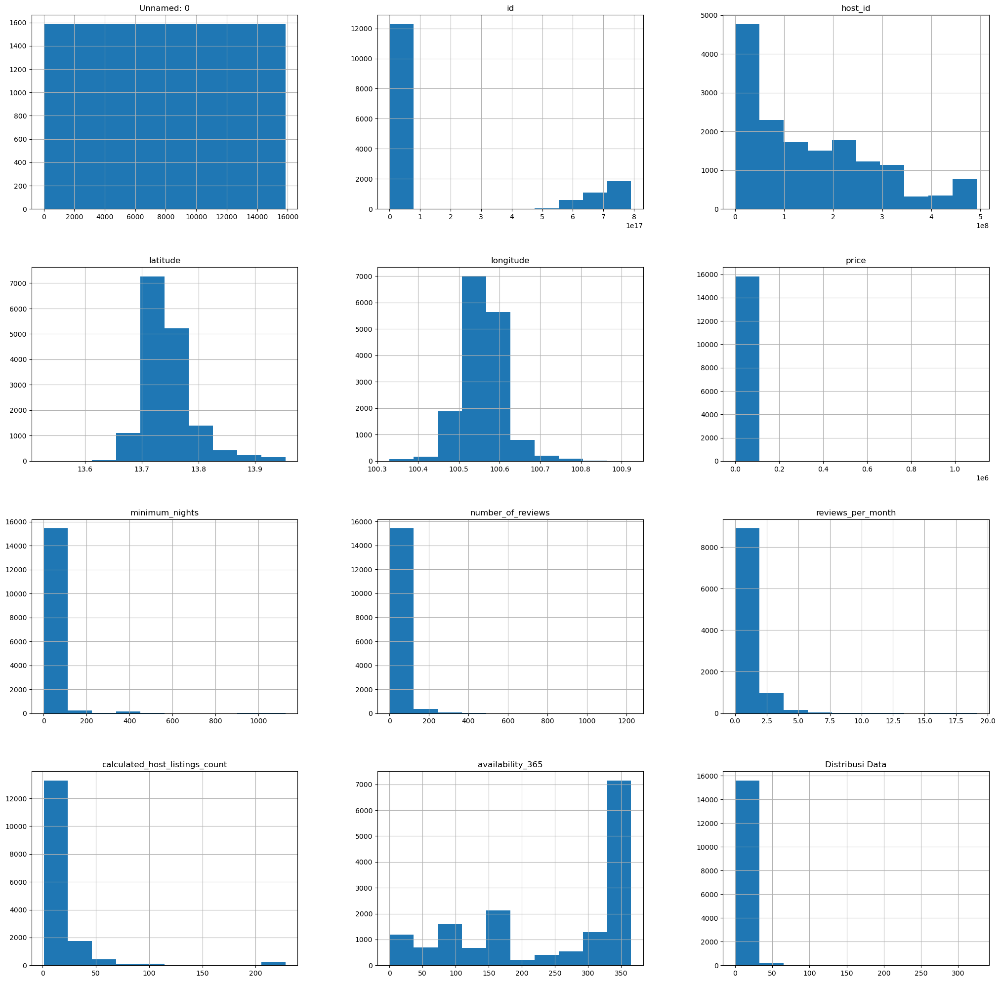

In [8]:
df.hist(figsize=(25,25))
plt.title('Distribusi Data')
plt.show()

> Dari data di atas, secara umum didapatkan beberapa informasi yaitu:
> - Terdapat 15.854 baris data yang terbagi dalam 17 kolom.
> - Tipe data pada dataset ini terbagi menjadi 12 kolom numerik dan 5 kolom objek.
> - Kolom `Unnamed: 0`, `id`, `host_id` tidak relevan bagi analisis. Maka dari itu kolom tersebut dapat dihapus.
> - Kolom `neighbourhood` lebih sesuai dinamakan dengan `district`.
> - Jumlah data pada kolom `last_review` dan `review_per_month` hanya ada 10.064 baris data. Sehingga untuk data pada kolom ini dapat diindikasikan terdapat *missing value*.
> - Jumlah data pada kolom `name` dan `host_name` terindikasi terdapat *missing value* karena jumlah datanya kurang dari jumlah data keseluruhan.
> - Penambahan kolom dapat dilakukan untuk keperluan analisis lebih lanjut.

### Data Cleaning

#### Menghapus kolom `Unnamed: 0`

Pada tahapan ini, kolom `Unnamed: 0` yang berisi index dari dataset akan dihapus karena tidak relevan untuk proses analisis.

In [9]:
df.drop(columns=['Unnamed: 0'], inplace=True)

df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


Kolom `Unnamed: 0` telah berhasil dihapus.

#### Mengganti nama kolom `neighbourhood` menjadi `district`

In [10]:
df.rename(columns={'neighbourhood': 'district'}, inplace=True)

df.head()

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


Pada tahapan ini, kolom `neighbourhood` telah berhasil diganti menjadi `district`.

#### Menangani *Missing Value*

In [11]:
persentase_missing_value = pd.DataFrame(df.isna().sum(), columns=['Total Missing Value'])
persentase_missing_value['Persentase (%)'] = round(persentase_missing_value['Total Missing Value'] / len(df) * 100, 2) 
persentase_missing_value = persentase_missing_value.sort_values(by='Persentase (%)', ascending=False).reset_index()
persentase_missing_value = persentase_missing_value.rename(columns={'index': 'Fitur'})
persentase_missing_value

,Fitur,Total Missing Value,Persentase (%)
0,last_review,5790,36.52
1,reviews_per_month,5790,36.52
2,name,8,0.05
3,host_name,1,0.01
4,id,0,0.00
5,host_id,0,0.00
6,district,0,0.00
7,latitude,0,0.00
8,longitude,0,0.00
9,room_type,0,0.00


<Axes: >

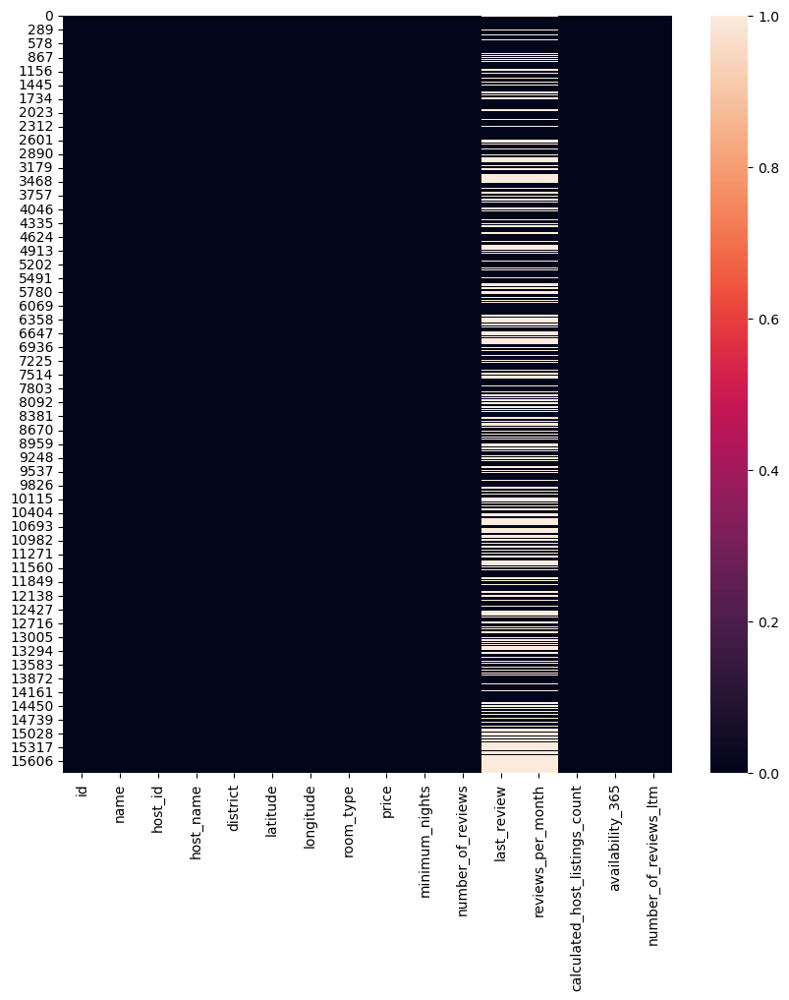

In [12]:
plt.figure(figsize=(10,10))
sns.heatmap(df.isna())

<Axes: >

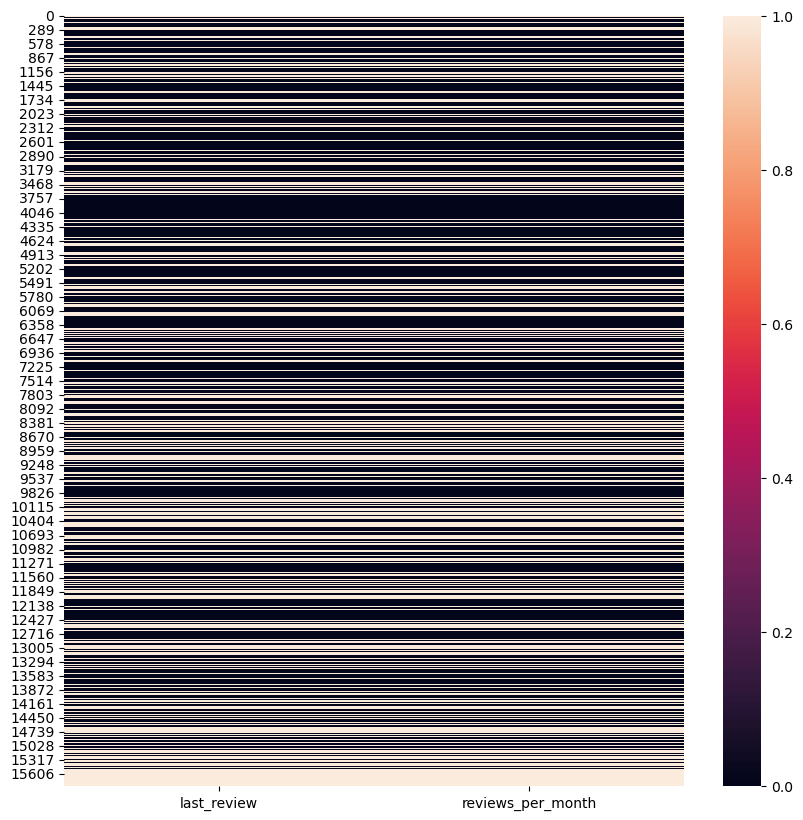

In [13]:
plt.figure(figsize=(10,10))
sns.heatmap(df[['last_review','reviews_per_month']].isna())

Secara garis besar:
* *missing value* di kolom `last_review` dan `reviews_per_month` memiliki proporsi yang cukup tinggi (>10%), dengan missing value di kolom `last_review` dan `reviews_per_month` mencapai 36.52%.
* *missing value* di kolom `last_review` dan `reviews_per_month` memiliki sebaran yang terlihat berkaitan, jika data di `last_review` kosong, maka kemungkinan besar data di `reviews_per_month` juga kosong.  


Ada 2 cara untuk menangani *missing value*:
* pertama, menghapus baris/kolom yang berisi *missing value*. Cara ini tidak disarankan dalam kasus kita, karena jumlah missing value yang tergolong cukup tinggi (sampai 36.5%).
* kedua, mengisi data yang hilang. Cara ini lebih disarankan. Ada beberapa metode yang bisa digunakan untuk mengisi missing value, cara yang paling baik adalah dengan mengisi data yang hilang dengan nilai sebenarnya, atau sedekat mungkin dengan nilai asli. Dalam kasus ini, kita akan mencoba mengisi *missing value* berdasarkan kolom lain yang secara domain knowledge atau secara statistik berkaitan dengan kolom yang memiliki *missing value*. Jika masih ada kolom yang tidak bisa diisi, barulah kita mengisi dengan angka *mean, median* atau *modus*. Menghapus data akan menjadi opsi terakhir.

**Missing value pada kolom `name`**

In [14]:
df[df['name'].isna()]

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaN,NaN,1,365,0
544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaN,NaN,1,365,0
572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaN,NaN,1,365,0
669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaN,NaN,1,365,0
1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaN,NaN,1,365,0
1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaN,NaN,1,365,0
2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


Pada kolom `name` terdapat *missing value* sebanyak 8 baris data. Untuk menangani ini, diputuskan untuk mengisi dengan nama listing berdasarkan kolom `host_name` yang sama. Kolom `calculated_host_listings_count`, host name **Pakaphol** memiliki 3 listing.

In [15]:
df[df['host_name'] == 'Pakaphol']

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1981,13400326,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72427,100.56443,Private room,950,1,1,2020-02-19,0.03,3,1,0
1982,13400758,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72373,100.56415,Private room,36363,1,0,NaN,NaN,3,1,0
2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


Untuk mengisi data NaN di index ke-2075, diputuskan untuk mengisi nama listing dengan `Errday Guest House` milik **Pakaphol**.

In [16]:
df['name'].iloc[2075] = 'Errday Guest House'
df[df['name']=='Errday Guest House']

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1981,13400326,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72427,100.56443,Private room,950,1,1,2020-02-19,0.03,3,1,0
1982,13400758,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72373,100.56415,Private room,36363,1,0,NaN,NaN,3,1,0
2075,13142743,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


Untuk 7 baris lainnya yang *missing value*, kurang memadainya informasi mengenai `host_name` yang sama dan juga listing Airbnb memang seharusnya memiliki nama sebagai bagian dari deskripsinya. Nama listing adalah salah satu elemen penting yang membantu menarik perhatian calon tamu dan memberikan gambaran singkat tentang apa yang ditawarkan. Karena proporsi jumlah *missing value* pada kolom `name` kecil dan juga terdapat data lain yang tidak lengkap, maka diputuskan untuk menghapus baris tersebut.

In [17]:
# drop NaN pada kolom 'name'

df = df.dropna(subset=['name'])
df.isna().sum()

id                                0   
name                              0   
host_id                           0   
host_name                         1   
district                          0   
latitude                          0   
longitude                         0   
room_type                         0   
price                             0   
minimum_nights                    0   
number_of_reviews                 0   
last_review                       5784
reviews_per_month                 5784
calculated_host_listings_count    0   
availability_365                  0   
number_of_reviews_ltm             0   
dtype: int64

Sudah tidak terdapat *missing value* pada kolom `name`.

**Missing value pada kolom `host_name`**

Terdapat 1 baris data yang *missing value* pada kolom `host_name`.

In [18]:
df[df['host_name'].isna()]

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


Berdasarkan kolom `calculated_host_listings_count`, kolom `host_name` yang NaN tersebut hanya memiliki 1 buah listing, sehingga tidak cukup informasi untuk mengisi data yang NaN. Selain itu, listing tersebut memiliki `last_review` pada tahun 2017, bisa diasumsikan bahwa listing tersebut sudah tidak aktif. Karena proporsi *missing value* yang kecil, maka diputuskan untuk menghapus saja baris tersebut.

In [19]:
# drop NaN pada kolom 'host_name'

df = df.dropna(subset=['host_name'])
df.isna().sum()

id                                0   
name                              0   
host_id                           0   
host_name                         0   
district                          0   
latitude                          0   
longitude                         0   
room_type                         0   
price                             0   
minimum_nights                    0   
number_of_reviews                 0   
last_review                       5784
reviews_per_month                 5784
calculated_host_listings_count    0   
availability_365                  0   
number_of_reviews_ltm             0   
dtype: int64

Sudah tidak terdapat *missing value* pada kolom `host_name`.

**Missing value pada kolom `last_review` dan `review_per_month`**

Pada kolom `last_review` dan `review_per_month` akan dicek terlebih dahulu, apakah terdapat keterkaitan antara data pada kolom tersebut. Di sini akan dilihat jika data pada kolom `last_review` == NaN, apakah pada kolom `review_per_month` == NaN juga.

In [20]:
df[(df['last_review'].isna()) & (df['reviews_per_month'].isna())].head()

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0
7,1738669,1 chic bedroom apartment in BKK,7045870,Jiraporn,Chatu Chak,13.82925,100.56737,Entire home/apt,1461,1,0,NaN,NaN,1,365,0
14,959254,"Deluxe Condo, Nana, Pool/GYM/Sauna",5153476,Natcha,Khlong Toei,13.71516,100.56806,Entire home/apt,1400,30,0,NaN,NaN,1,365,0


In [21]:
# cek apakah ada keterkaitan antara data kolom last_review terhadap reviews_per_month

# cek apakah ada data pada kolom last_review saat reviews_per_month = NaN
last_review_yes = df[(df['last_review'].notna()) & (df['reviews_per_month'].isna())]
display(last_review_yes)

# cek apakah ada data pada kolom reviews_per_month saat last_review = NaN
reviews_per_month_yes = df[(df['last_review'].isna()) & (df['reviews_per_month'].notna())]
display(reviews_per_month_yes)

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm


,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm


Dari data tersebut dapat dilihat apabila data pada kolom `last_review` == NaN, maka data pada kolom `reviews_per_month` == NaN juga. Selajutnya akan dilihat apakah kolom yang NaN tersebut memiliki review sebelumnya atau tidak.

In [22]:
display(df[df['last_review'].isna()]['number_of_reviews'].value_counts(),
df[df['reviews_per_month'].isna()]['number_of_reviews'].value_counts())

number_of_reviews
0    5784
Name: count, dtype: int64

number_of_reviews
0    5784
Name: count, dtype: int64

Dari informasi di atas, dapat asumsikan bahwa listing yang nilai `last_review` dan `reviews_per_month` memiliki *missing values*, ternyata belum mendapatkan review dari pengguna. Sehingga hal yang wajar apabila kolom tersebut belum memiliki nilai. Karena proporsi *missing value* cukup besar, maka data pada kolom `last_review` dan `reviews_per_month` tidak dapat dihapus. Selanjutnya akan dilakukan imputasi untuk mengisi data yang NaN.

In [23]:
# df['last_review'] = pd.to_datetime(df['last_review'], format='%Y-%m-%d')
# df.head()

In [24]:
# df['last_review'].info()

Cek tanggal terakhir review di dataset.

In [25]:
# tanggal_terakhir = df['last_review'].max()
# tanggal_terakhir_str = tanggal_terakhir.strftime('%Y-%m-%d')
# print(f"Tanggal terakhir pada kolom last review: {tanggal_terakhir_str}")

Cek apakah ada data yang last review pada tahun 2022 yang tidak memiliki review dalam 12 bulan terakhir (number_of_reviews_ltm == 0)

In [26]:
df[(df['last_review'] == 2022) & (df['number_of_reviews_ltm'] == 0)]

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm


In [27]:
df[(df['last_review'].isna()) & (df['reviews_per_month'].isna()) & (df['number_of_reviews'] == 0)].head()

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0
7,1738669,1 chic bedroom apartment in BKK,7045870,Jiraporn,Chatu Chak,13.82925,100.56737,Entire home/apt,1461,1,0,NaN,NaN,1,365,0
14,959254,"Deluxe Condo, Nana, Pool/GYM/Sauna",5153476,Natcha,Khlong Toei,13.71516,100.56806,Entire home/apt,1400,30,0,NaN,NaN,1,365,0


Selanjutnya untuk imputasi data NaN pada kolom `last_review` akan menggunakan tanggal terakhir review yang tersedia pada dataset. Pada dataset, untuk tanggal terakhir review ada pada tanggal **2022-12-28**, agar pengisian data tidak mempengaruhi data awal yang sudah ada, maka untuk mengisi data yang NaN menjadi Unknown. Diasumsikan listing yang memiliki *missing value* pada kolom `last_review` dan `reviews_per_month` merupakan listing baru yang belum memiliki review.

Lalu, untuk mengisi *missing value* di kolom `reviews_per_month`, akan diisi dengan 0. Karena listing tersebut belum memiliki review sama sekali, maka listing tersebut tidak ada jumlah review per bulan.

In [28]:
df.loc[(df['last_review'].isna()) & (df['reviews_per_month'].isna()) & (df['number_of_reviews'] == 0),['last_review', 'reviews_per_month']] = ['Unknown', 0]
df

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.759830,100.541340,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.668180,100.616740,Private room,1316,1,0,Unknown,0.00,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.752320,100.624020,Private room,800,60,0,Unknown,0.00,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.788230,100.572560,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.768720,100.633380,Private room,1905,1,0,Unknown,0.00,3,365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,Unknown,0.00,1,362,0
15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,Unknown,0.00,14,365,0
15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,Unknown,0.00,14,365,0
15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,Unknown,0.00,14,365,0


In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15846 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              15846 non-null  int64  
 1   name                            15846 non-null  object 
 2   host_id                         15846 non-null  int64  
 3   host_name                       15846 non-null  object 
 4   district                        15846 non-null  object 
 5   latitude                        15846 non-null  float64
 6   longitude                       15846 non-null  float64
 7   room_type                       15846 non-null  object 
 8   price                           15846 non-null  int64  
 9   minimum_nights                  15846 non-null  int64  
 10  number_of_reviews               15846 non-null  int64  
 11  last_review                     15846 non-null  object 
 12  reviews_per_month               15846

#### Menangani data kolom `price`

In [30]:
df['price'].describe()

count    1.584600e+04
mean     3.218430e+03
std      2.497839e+04
min      0.000000e+00
25%      9.000000e+02
50%      1.429000e+03
75%      2.429000e+03
max      1.100000e+06
Name: price, dtype: float64

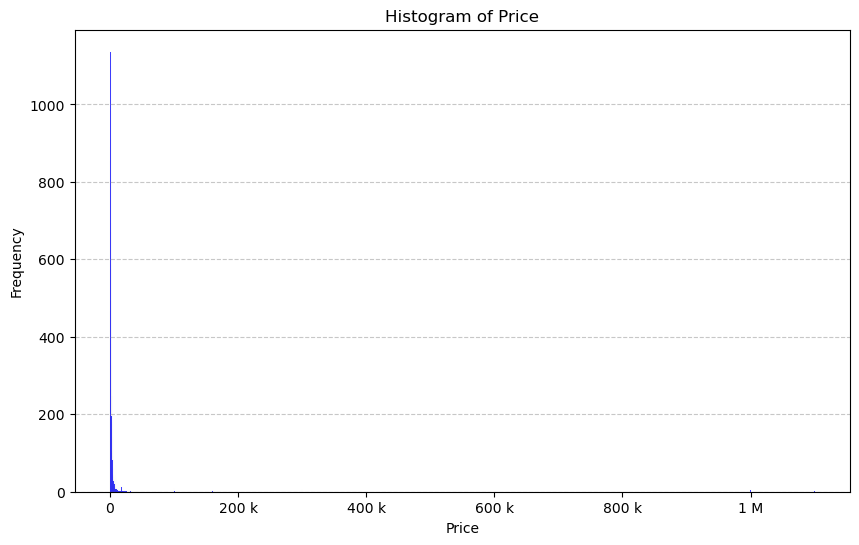

In [31]:
from matplotlib import ticker

# Membuat histogram
fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(df['price'], color='blue')
plt.title('Histogram of Price')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
ax.xaxis.set_major_formatter(ticker.EngFormatter())
plt.show()

Pada kolom `price`, data tidak terdistribusi dengan normal. Sehingga untuk pengisian data dengan `price` == 0 akan diisikan dengan median harga sesuai dengan `district` dan `room_type`.

**Menangani `price` = 0**

In [32]:
df[df['price'] == 0]

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,0,1,0,Unknown,0.0,1,0,0


Dalam konteks platform seperti Airbnb, secara umum, harga nol (0) untuk sebuah listing tidak biasa, hal itu bisa terjadi kesalahan saat memasukkan harga, atau kesalahan teknis di *platform* yang mengakibatkan harga ditampilkan sebagai nol. Untuk menangani hal tersebut, maka listing dengan harga THB 0 akan diubah dengan harga median dari kolom `district`: **Vadhana** dengan `room_type`: **Hotel room**. Median harga digunakan karena data pada kolom `price` tidak terdistribusi normal.

In [33]:
df[df['price']==1100000]

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
12868,635676064543597376,New 1 bedroom apartment BTS MRT Asoke,12464705,Lucio,Vadhana,13.742186,100.560394,Entire home/apt,1100000,14,0,Unknown,0.0,1,365,0


In [34]:
median_harga = df[(df['district'] == 'Vadhana') & (df['room_type'] == 'Hotel room')]['price'].median()
print(f'Median harga untuk hotel room di distrik Vadhana: THB {median_harga}')

Median harga untuk hotel room di distrik Vadhana: THB 2414.0


Median harga ununtuk hotel room di distrik Vadhana adalah THB 2414. Selanjutnya nilai tersebut akan dimasukkan pada listing dengan nilai harga = 0.

In [35]:
df.loc[df['price'] == 0, 'price'] = median_harga
df[df['id'] == 44563108]

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,2414,1,0,Unknown,0.0,1,0,0


#### Menghapus kolom yang tidak relevan

Kolom `id`, `host_id`, `availability_365` tidak relevan dengan analisis, maka kolom tersebut dapat dihapus.

In [36]:
df.drop(columns=['id', 'host_id', 'availability_365'], inplace=True)
df.head()

,name,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm
0,Nice room with superb city view,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,0
1,"Easy going landlord,easy place",Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,Unknown,0.00,2,0
2,modern-style apartment in Bangkok,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,Unknown,0.00,1,0
3,Spacious one bedroom at The Kris Condo Bldg. 3,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,1
4,Suite Room 3 at MetroPoint,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,Unknown,0.00,3,0


#### Duplikasi Data

In [37]:
print(f'Jumlah duplikasi data: {df.duplicated().sum()}')

Jumlah duplikasi data: 8


In [38]:
df[df.duplicated(keep=False)]

,name,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm
5890,NA BANGLAMPOO GUEST HOUSE,Yui,Phra Nakhon,13.762790,100.497900,Private room,1400,1,0,Unknown,0.0,9,0
5976,NA BANGLAMPOO GUEST HOUSE,Yui,Phra Nakhon,13.762790,100.497900,Private room,1400,1,0,Unknown,0.0,9,0
8789,small1,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,Unknown,0.0,4,0
8790,small1,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,Unknown,0.0,4,0
15120,Sathon Luxury Loft/China Town/Icon Siam,Alex,Sathon,13.710777,100.519891,Entire home/apt,1580,1,0,Unknown,0.0,13,0
15121,Sathon Luxury Loft/China Town/Icon Siam,Alex,Sathon,13.710777,100.519891,Entire home/apt,1580,1,0,Unknown,0.0,13,0
15183,Sathon Luxury 2 br/China Town/Icon Siam,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,Unknown,0.0,44,0
15186,Sathon Luxury 2 br/China Town/Icon Siam,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,Unknown,0.0,44,0
15190,Sathon Luxury 2 br/China Town/Icon Siam,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,Unknown,0.0,40,0
15191,Sathon Luxury 2 br/China Town/Icon Siam,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,Unknown,0.0,40,0


In [39]:
# Menghapus baris duplikat
df.drop_duplicates(inplace=True)

Data yang duplikat telah berhasil dihapus.

#### Menangani Outlier

In [40]:
df.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm
count,15838.000000,15838.000000,1.583800e+04,15838.000000,15838.000000,15838.000000,15838.000000,15838.000000
mean,13.745140,100.559904,3.219256e+03,15.305973,16.670539,0.516694,13.890706,3.485036
std,0.043028,0.050920,2.498466e+04,50.838861,40.630543,0.953096,30.280874,8.920753
min,13.527300,100.329550,2.780000e+02,1.000000,0.000000,0.000000,1.000000,0.000000
25%,13.720105,100.529690,9.000000e+02,1.000000,0.000000,0.000000,1.000000,0.000000
50%,13.738490,100.561415,1.429000e+03,1.000000,2.000000,0.090000,4.000000,0.000000
75%,13.759490,100.585150,2.429000e+03,7.000000,13.000000,0.670000,13.000000,3.000000
max,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,19.130000,228.000000,325.000000


In [41]:
kolom_numerikal = df.describe().columns
tabel_outlier = pd.DataFrame(columns = ['Mean', 'Median' , 'Batas Bawah' , 'Batas Atas' , 'Jumlah Outlier' , 'Persentase Outlier (%)'])
for kolom in kolom_numerikal:
    Q1 = df[kolom].quantile(0.25)
    Q2 = df[kolom].quantile(0.5)
    Q3 = df[kolom].quantile(0.75)
    batas_atas = Q3 + 1.5 * (Q3 - Q1)
    batas_bawah = Q1 - 1.5 * (Q3 - Q1)
    tabel_outlier.loc[kolom] = [df[kolom].mean(), df[kolom].median(), batas_bawah, batas_atas, len(df[(df[kolom]>batas_atas) | (df[kolom]<batas_bawah)]), len(df[(df[kolom]>batas_atas) | (df[kolom]<batas_bawah)]) / len(df) * 100]
display(tabel_outlier.round(2))

,Mean,Median,Batas Bawah,Batas Atas,Jumlah Outlier,Persentase Outlier (%)
latitude,13.75,13.74,13.66,13.82,1098.0,6.93
longitude,100.56,100.56,100.45,100.67,602.0,3.80
price,3219.26,1429.00,-1393.50,4722.50,1402.0,8.85
minimum_nights,15.31,1.00,-8.00,16.00,3168.0,20.00
number_of_reviews,16.67,2.00,-19.50,32.50,2240.0,14.14
reviews_per_month,0.52,0.09,-1.01,1.68,1471.0,9.29
calculated_host_listings_count,13.89,4.00,-17.00,31.00,1828.0,11.54
number_of_reviews_ltm,3.49,0.00,-4.50,7.50,2219.0,14.01


Pada data ini, terdapat outlier pada kolom numerikal.
- Untuk kolom `latitude` dan `latitude`, outlier diabaikan saja karena datanya merupakan penunjuk lokasi.
- Pada kolom `price` terdapat outlier sebanyak 1402 data, pada kolom ini memungkinkan harga listing yang tinggi dan jauh dari nilai batas atas. Karena pada setiap listing menawarkan fasiltas yang berbeda-beda, mulai dari fasilitas yang standar hingga fasilitas yang exclusive, maka rentang harganya pun beragam.
- kolom `minimum_nights` terdapat outlier yang memungkinkan pemilik host menentukan jumlah minimum malam untuk menginap lebih dari 365 hari bahkan hingga minimal lebih dari 1000 hari. Hal tersebut tidak biasa, tetapi pemilik host memiliki kebijakan masing-masing dalam menentukan jumlah minimal malam untuk menginap.
- `number_of_review`, `reviews_per_month`, dan `number_of_review_ltm` merupakan jumlah dari review yang diterima oleh host pada setiap listing. Hal tersebut memungkinkan untuk terdapat outlier, karena pada setiap listing terdapat review yang berbeda-beda dan merupakan hal yang wajar apabila terdapat review hingga ribuan untuk listing yang populer.
- `last_review` merupakan tanggal terakhir listing mendapatkan review, sehingga outlier dapat diabaikan.
- `calculated_host_listings_count` merupakan jumlah listing yang dimiliki oleh satu host. Pada data ini wajar apabila seseorang memiliki lebih dari satu listing, terutama untuk perusahaan di bidang penginapan yang memiliki banyak cabang ditiap distrik.

#### Membuat kolom tambahan

Pada dataframe ini, ditambahkan kolom kategorikal baru yang relevan dengan analis. Pertama, membuat kolom baru untuk kategori harga yang terbagi menjadi 3 kategori, yaitu ***Budget*** untuk harga listing <= 1000 THB, ***Mid-range*** untuk harga listing <= 3000 THB, dan kategori ***Luxury*** untuk harga lebih dari > 3000.

In [42]:
# Membuat fungsi untuk kategori harga
def categorize_price(price):
    if price <= 1000:
        return 'Budget'
    elif 1001 <= price <= 3000:
        return 'Mid-range'
    else:
        return 'Luxury'

# membuat kolom price_category
df['price_category'] = df['price'].apply(categorize_price)

df.head()

,name,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm,price_category
0,Nice room with superb city view,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,0,Mid-range
1,"Easy going landlord,easy place",Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,Unknown,0.00,2,0,Mid-range
2,modern-style apartment in Bangkok,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,Unknown,0.00,1,0,Budget
3,Spacious one bedroom at The Kris Condo Bldg. 3,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,1,Mid-range
4,Suite Room 3 at MetroPoint,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,Unknown,0.00,3,0,Mid-range


Selanjutnya, membuat kolom baru untuk kategori review berdasarkan dari kolom `number_of_reviews`. Pada kolom ini review dikategorikan menjadi 3 bagian, yaitu listing yang memiliki review = 0 dikategorikan sebagai ***No Review***, lalu untuk listing yang jumlah reviewnya <= 20 sebagai ***Moderately Reviewed***, dan yang memiliki jumlah review di atasnya dikategorikan sebagai ***Highly Reviewed***.

In [43]:
# Define review categories
def categorize_reviews(num_reviews):
    if num_reviews == 0:
        return 'No Review'
    elif 1 <= num_reviews <= 20:
        return 'Moderately Reviewed'
    else:
        return 'Highly Reviewed'

# Apply the function to create a new 'Review Category' column
df['review_category'] = df['number_of_reviews'].apply(categorize_reviews)

df.head()

,name,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm,price_category,review_category
0,Nice room with superb city view,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,0,Mid-range,Highly Reviewed
1,"Easy going landlord,easy place",Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,Unknown,0.00,2,0,Mid-range,No Review
2,modern-style apartment in Bangkok,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,Unknown,0.00,1,0,Budget,No Review
3,Spacious one bedroom at The Kris Condo Bldg. 3,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,1,Mid-range,Moderately Reviewed
4,Suite Room 3 at MetroPoint,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,Unknown,0.00,3,0,Mid-range,No Review


Terakhir, untuk kolom `number_of_reviews_ltm` digunakan untuk membuat kolom baru, yaitu `listing_category` yang memuat informasi apakah listing tersebut populer berdasarkan review dalam 12 bulan terakhir. Nilai 7.5 diguanakan sebagai threshold value yang diambil dari nilai batas atas untuk kolom `number_of_reviews_ltm`. Sehingga, hanya listing yang memiliki jumlah review dalam 12 bulan terakhir > 7.5 yang termasuk populer berdasarkan review dari tamu.

In [44]:
# Define categories based on number_of_reviews_ltm
def categorize_recent_reviews(reviews_ltm):
    if reviews_ltm > 7.5:
        return 'Popular'
    else:
        return 'Unpopular'

# Apply the function to create a new 'Recent Review Category' column
df['listing_category'] = df['number_of_reviews_ltm'].apply(categorize_recent_reviews)

df.head()

,name,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm,price_category,review_category,listing_category
0,Nice room with superb city view,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,0,Mid-range,Highly Reviewed,Unpopular
1,"Easy going landlord,easy place",Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,Unknown,0.00,2,0,Mid-range,No Review,Unpopular
2,modern-style apartment in Bangkok,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,Unknown,0.00,1,0,Budget,No Review,Unpopular
3,Spacious one bedroom at The Kris Condo Bldg. 3,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,1,Mid-range,Moderately Reviewed,Unpopular
4,Suite Room 3 at MetroPoint,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,Unknown,0.00,3,0,Mid-range,No Review,Unpopular


#### Data yang sudah bersih

In [45]:
df.reset_index(drop=True, inplace=True)
df.head()

,name,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm,price_category,review_category,listing_category
0,Nice room with superb city view,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,0,Mid-range,Highly Reviewed,Unpopular
1,"Easy going landlord,easy place",Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,Unknown,0.00,2,0,Mid-range,No Review,Unpopular
2,modern-style apartment in Bangkok,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,Unknown,0.00,1,0,Budget,No Review,Unpopular
3,Spacious one bedroom at The Kris Condo Bldg. 3,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,1,Mid-range,Moderately Reviewed,Unpopular
4,Suite Room 3 at MetroPoint,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,Unknown,0.00,3,0,Mid-range,No Review,Unpopular


In [46]:
pd.DataFrame({
    'feature': df.columns.values,
    'data_type': df.dtypes.values,
    'null': df.isna().mean().values * 100,
    'negative': [True if df[col].dtype == int and (df[col] < 0).any() else False for col in df.columns],
    'n_unique': df.nunique().values,
    'min': df.min().values,
    'max': df.max().values,
    'sample_unique': [df[col].unique()[:5] for col in df.columns]
})

,feature,data_type,null,negative,n_unique,min,max,sample_unique
0,name,object,0.0,False,14793,!!!OMG!!/4 mins to Train St./Train Market/火车头夜市,🥇月租|50%🚇ThongLo 2mi疫情居家办公全景落地玻璃花园景大两房两卫一厅带浴缸厨房阳台,"[Nice room with superb city view, Easy going landlord,easy place, modern-style apartment in Bangkok, Spacious one bedroom at The Kris Condo Bldg. 3, Suite Room 3 at MetroPoint]"
1,host_name,object,0.0,False,5306,.● Bm,ﾀｯ,"[Nuttee, Emy, Familyroom, Sirilak, Kasem]"
2,district,object,0.0,False,50,Bang Bon,Yan na wa,"[Ratchathewi, Bang Na, Bang Kapi, Din Daeng, Bang Kho laen]"
3,latitude,float64,0.0,False,9602,13.5273,13.95354,"[13.75983, 13.66818, 13.75232, 13.78823, 13.76872]"
4,longitude,float64,0.0,False,10222,100.32955,100.92344,"[100.54134, 100.61674, 100.62402, 100.57256, 100.63338]"
5,room_type,object,0.0,False,4,Entire home/apt,Shared room,"[Entire home/apt, Private room, Hotel room, Shared room]"
6,price,int64,0.0,False,3039,278,1100000,"[1905, 1316, 800, 1286, 1000]"
7,minimum_nights,int64,0.0,False,86,1,1125,"[3, 1, 60, 7, 250]"
8,number_of_reviews,int64,0.0,False,298,0,1224,"[65, 0, 2, 19, 1]"
9,last_review,object,0.0,False,1669,2012-12-15,Unknown,"[2020-01-06, Unknown, 2022-04-01, 2017-08-03, 2014-02-03]"


## **Eksplorasi Data**

### Statistika Desktrptif

In [47]:
display(df.describe(), df.describe(include='object'))

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm
count,15838.000000,15838.000000,1.583800e+04,15838.000000,15838.000000,15838.000000,15838.000000,15838.000000
mean,13.745140,100.559904,3.219256e+03,15.305973,16.670539,0.516694,13.890706,3.485036
std,0.043028,0.050920,2.498466e+04,50.838861,40.630543,0.953096,30.280874,8.920753
min,13.527300,100.329550,2.780000e+02,1.000000,0.000000,0.000000,1.000000,0.000000
25%,13.720105,100.529690,9.000000e+02,1.000000,0.000000,0.000000,1.000000,0.000000
50%,13.738490,100.561415,1.429000e+03,1.000000,2.000000,0.090000,4.000000,0.000000
75%,13.759490,100.585150,2.429000e+03,7.000000,13.000000,0.670000,13.000000,3.000000
max,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,19.130000,228.000000,325.000000


,name,host_name,district,room_type,last_review,price_category,review_category,listing_category
count,15838,15838,15838,15838,15838,15838,15838,15838
unique,14793,5306,50,4,1669,3,3,2
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt,Unknown,Mid-range,Moderately Reviewed,Unpopular
freq,45,228,2150,8906,5776,7914,6955,13619


### DIstribusi Data Numerikal

Dilakukan uji normalitas untuk melihat apakah data pada kolom numerik terdistribusi secara normal atau tidak. Karena jumlah data 15.838, maka uji normalitas dilakukan menggunakan D'Agostino and Pearson's Test.

In [48]:
numerical = df.describe(include=['int64', 'float64']).columns

In [49]:
from scipy.stats import normaltest

# Uji D'Agostino-Pearson
dist = []

for i in range(len(numerical)):
    feature_name = numerical[i]
    stat, p_value = normaltest(df[feature_name].dropna())
    
    if p_value > 0.05:
        distribution = "Normally Distributed"
        decision = "Fail to Reject H0"
    else:
        distribution = "Not Normally Distributed"
        decision = "Reject H0"
    
    dist.append([feature_name, p_value, decision, distribution])

dist_df = pd.DataFrame(dist, columns=['Fitur', 'P-value', 'Keputusan', 'Distribusi'])
dist_df

,Fitur,P-value,Keputusan,Distribusi
0,latitude,0.0,Reject H0,Not Normally Distributed
1,longitude,0.0,Reject H0,Not Normally Distributed
2,price,0.0,Reject H0,Not Normally Distributed
3,minimum_nights,0.0,Reject H0,Not Normally Distributed
4,number_of_reviews,0.0,Reject H0,Not Normally Distributed
5,reviews_per_month,0.0,Reject H0,Not Normally Distributed
6,calculated_host_listings_count,0.0,Reject H0,Not Normally Distributed
7,number_of_reviews_ltm,0.0,Reject H0,Not Normally Distributed


In [50]:
# Jumlah outlier dan persentasenya pada tiap kolom numerikal

tabel_outlier = pd.DataFrame(columns = ['Median' , 'Batas Bawah' , 'Batas Atas' , 'Jumlah Outlier' , 'Persentase Outlier (%)'])
for kolom in numerical:
    Q1 = df[kolom].quantile(0.25)
    Q2 = df[kolom].quantile(0.5)
    Q3 = df[kolom].quantile(0.75)
    batas_atas = Q3 + 1.5 * (Q3 - Q1)
    batas_bawah = Q1 - 1.5 * (Q3 - Q1)
    tabel_outlier.loc[kolom] = [df[kolom].median(), batas_bawah, batas_atas, len(df[(df[kolom]>batas_atas) | (df[kolom]<batas_bawah)]), len(df[(df[kolom]>batas_atas) | (df[kolom]<batas_bawah)]) / len(df) * 100]
display(tabel_outlier.round(2))

,Median,Batas Bawah,Batas Atas,Jumlah Outlier,Persentase Outlier (%)
latitude,13.74,13.66,13.82,1098.0,6.93
longitude,100.56,100.45,100.67,602.0,3.80
price,1429.00,-1393.50,4722.50,1402.0,8.85
minimum_nights,1.00,-8.00,16.00,3168.0,20.00
number_of_reviews,2.00,-19.50,32.50,2240.0,14.14
reviews_per_month,0.09,-1.01,1.68,1471.0,9.29
calculated_host_listings_count,4.00,-17.00,31.00,1828.0,11.54
number_of_reviews_ltm,0.00,-4.50,7.50,2219.0,14.01


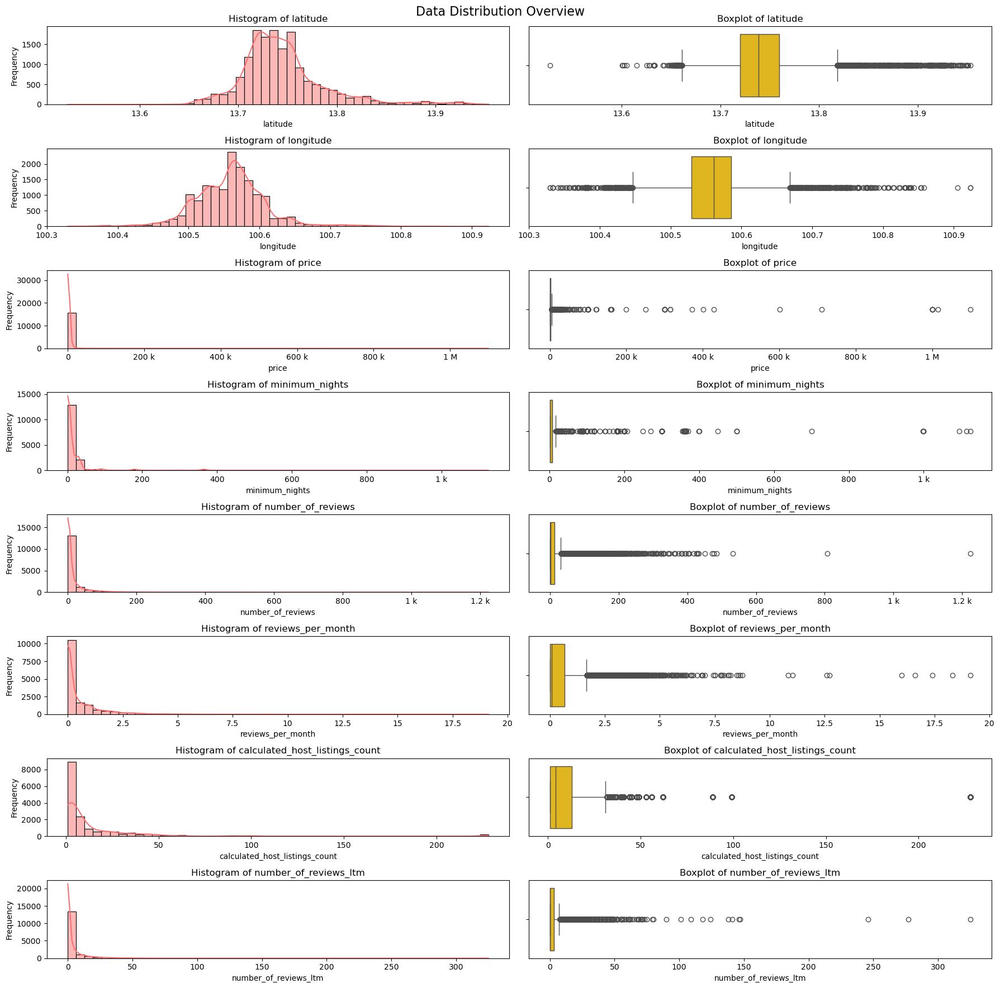

In [51]:
plt.figure(figsize=(18, 18))
plt.suptitle('Data Distribution Overview', fontsize=16)

for index, col in enumerate(numerical):
    # Histogram
    ax1 = plt.subplot(len(numerical), 2, index * 2 + 1)
    sns.histplot(df[col], kde=True, color='#FA7070', bins=50)
    plt.title(f'Histogram of {col}', size=12)
    plt.xlabel(col)
    plt.ylabel('Frequency')
    ax1.xaxis.set_major_formatter(ticker.EngFormatter())

    # Boxplot
    ax2 = plt.subplot(len(numerical), 2, index * 2 + 2)
    sns.boxplot(x=df[col], color='#FFC700')
    plt.title(f'Boxplot of {col}', size=12)
    plt.xlabel(col)
    ax2.xaxis.set_major_formatter(ticker.EngFormatter())

plt.tight_layout()
plt.show()

Data pada kolom bertipe numerikal, setelah dilakukan uji normalitas data tersebut memiliki distribusi yang tidak normal. Sehingga untuk proses analasis selanjutnya, akan digunakan **median** dari setiap kolom data sebagai **pusat sebaran data**.

### Distribusi Data Kategorikal

#### Proporsi kolom `district`

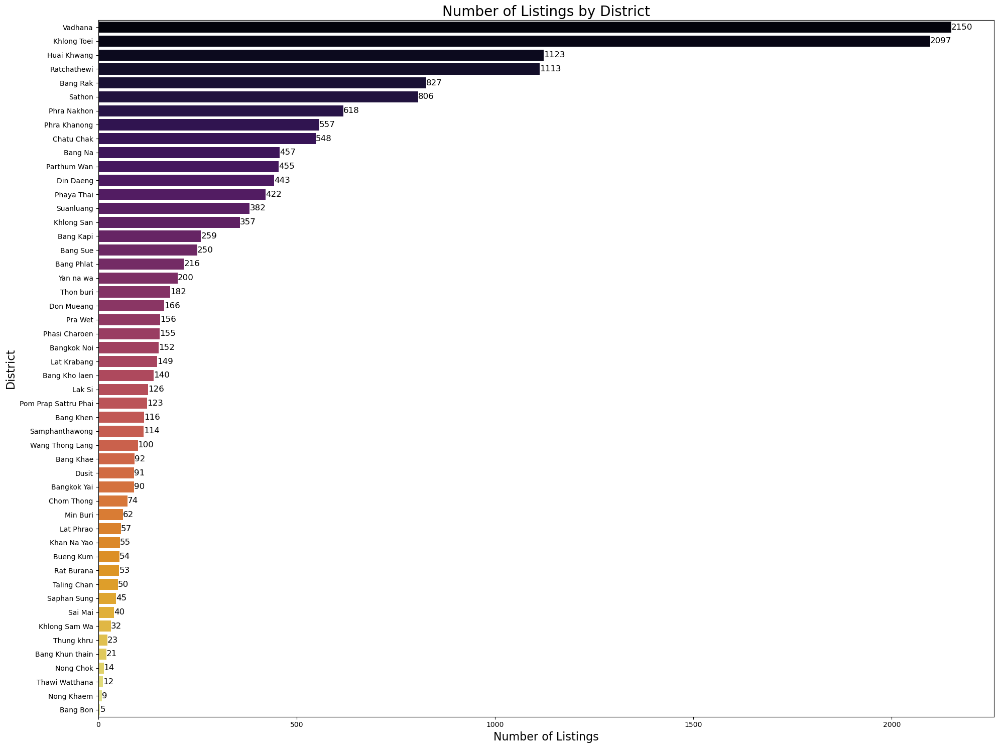

In [52]:
# Count the occurrences of each district
district_counts = df['district'].value_counts()

# Set up the figure size
plt.figure(figsize=(20, 15))

# Create the bar plot
ax = sns.barplot(y=district_counts.index, x=district_counts.values, palette='inferno')

# Add title and labels
ax.set_title('Number of Listings by District', fontsize=20)
ax.set_xlabel('Number of Listings', fontsize=16)
ax.set_ylabel('District', fontsize=16)

# Add text annotations on top of each bar
for index, value in enumerate(district_counts.values):
    ax.text(value, index, str(value), ha='left', va='center', fontsize=12)

# Rotate the y-axis labels for better readability
plt.yticks(rotation=0)

# Display the plot
plt.tight_layout()
plt.show()

> - Distrik Vadhana memiliki jumlah listing terbanyak yaitu 2150 listing.
> - Distrik Bang Bon memiliki jumlah listing paling sedikit yaitu hanya ada 5 listing dalam dataset.
> - Hanya ada 4 distrik yang memiliki jumlah listing diatas 1000.

#### Proporsi kolom `room_type`

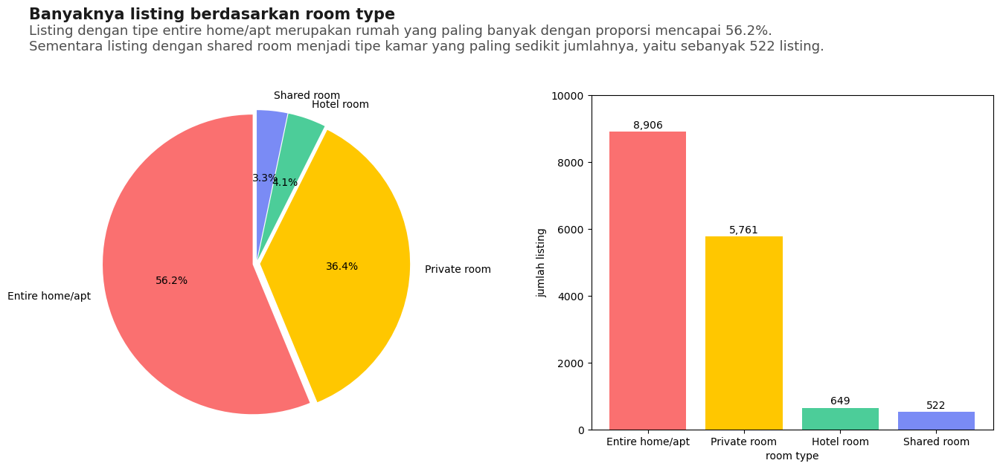

In [53]:
number_of_room_type = df.groupby('room_type', as_index=False)[['price']].count().sort_values('price', ascending=False)

# set axes and figure size
fig, axes = plt.subplots(1, 2, figsize=(18,6))

# create pie chart
axes[0].pie(
    number_of_room_type['price'],
    colors=['#FA7070', '#FFC700', '#4CCD99', '#7A8Bf5'],
    labels=number_of_room_type['room_type'],
    autopct='%1.1f%%',
    startangle=90,
    pctdistance=0.55,
    explode=[0.025, 0.025, 0.025, 0.025]
)
# create bar chart
axes[1].bar(
    number_of_room_type['room_type'],
    number_of_room_type['price'],
    color=['#FA7070', '#FFC700', '#4CCD99', '#7A8Bf5'],
)

# set value on bar chart
for i in axes[1].patches:
    value = '{:,.0f}'.format(i.get_height())
    x = i.get_x() + i.get_width()/2
    y = i.get_height() + 100
    axes[1].annotate(value, (x, y), ha='center')

# set axis label
axes[0].axis('equal')
axes[1].set(
    ylabel='jumlah listing',
    ylim=(0, 10000),
    xlabel='room type'
)

# set position
axes[0].set_position([0.1, 0.05, 0.3, 0.75])
axes[1].set_position([0.5, 0.05, 0.3, 0.75])

# set title
fig.text(
    0.08,
    0.97,
    "Banyaknya listing berdasarkan room type",
    color="#1a1a1a",
    fontsize=15,
    weight="bold"
)

subtitle = [
    "Listing dengan tipe entire home/apt merupakan rumah yang paling banyak dengan proporsi mencapai 56.2%.",
    "Sementara listing dengan shared room menjadi tipe kamar yang paling sedikit jumlahnya, yaitu sebanyak 522 listing."
]
fig.text(
    0.08,
    0.90,
    "\n".join(subtitle),
    ha="left",
    color="#4d4d4d",
    fontsize=13,
)

# show
plt.show()

#### Proporsi kolom `price_category`

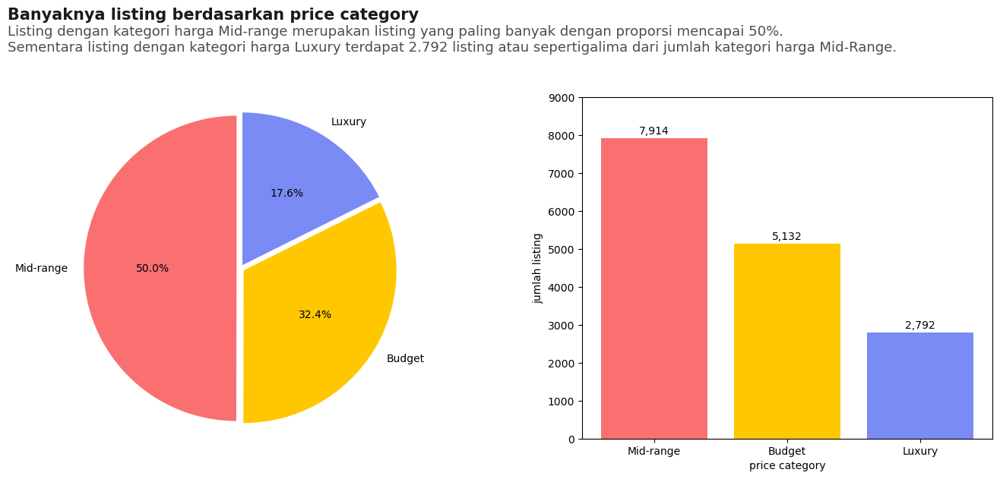

In [54]:
number_of_price_category = df.groupby('price_category', as_index=False)[['price']].count().sort_values('price', ascending=False)

# set axes and figure size
fig, axes = plt.subplots(1, 2, figsize=(18,6))

# create pie chart
axes[0].pie(
    number_of_price_category['price'],
    colors=['#FA7070', '#FFC700', '#7A8Bf5'],
    labels=number_of_price_category['price_category'],
    autopct='%1.1f%%',
    startangle=90,
    pctdistance=0.55,
    explode=[0.025, 0.025, 0.025]
)
# create bar chart
axes[1].bar(
    number_of_price_category['price_category'],
    number_of_price_category['price'],
    color=['#FA7070', '#FFC700', '#7A8Bf5'],
)

# set value on bar chart
for i in axes[1].patches:
    value = '{:,.0f}'.format(i.get_height())
    x = i.get_x() + i.get_width()/2
    y = i.get_height() + 100
    axes[1].annotate(value, (x, y), ha='center')

# set axis label
axes[0].axis('equal')
axes[1].set(
    ylabel='jumlah listing',
    ylim=(0, 9000),
    xlabel='price category'
)

# set position
axes[0].set_position([0.1, 0.05, 0.3, 0.75])
axes[1].set_position([0.5, 0.05, 0.3, 0.75])

# set title
fig.text(
    0.08,
    0.97,
    "Banyaknya listing berdasarkan price category",
    color="#1a1a1a",
    fontsize=15,
    weight="bold"
)

subtitle = [
    "Listing dengan kategori harga Mid-range merupakan listing yang paling banyak dengan proporsi mencapai 50%.",
    "Sementara listing dengan kategori harga Luxury terdapat 2.792 listing atau sepertigalima dari jumlah kategori harga Mid-Range."
]
fig.text(
    0.08,
    0.90,
    "\n".join(subtitle),
    ha="left",
    color="#4d4d4d",
    fontsize=13,
)

# show
plt.show()

#### Proporsi kolom `review_category`

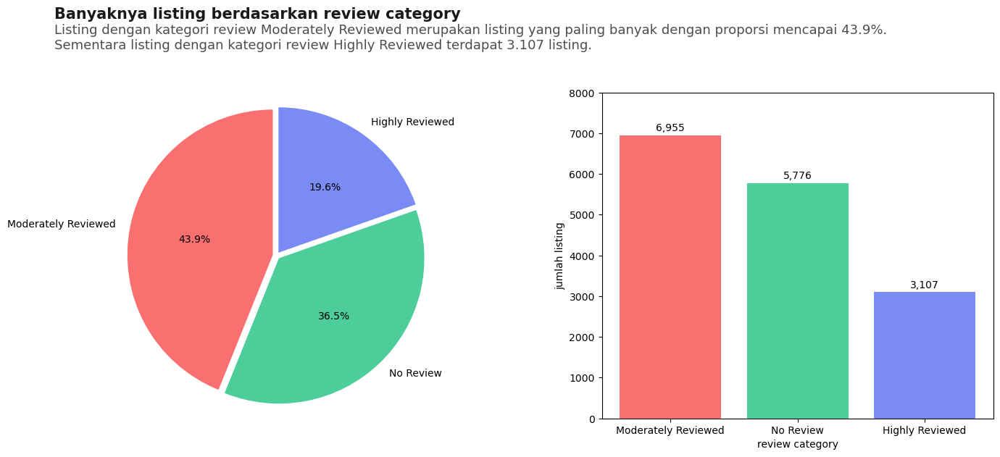

In [55]:
number_of_review_category = df.groupby('review_category', as_index=False)[['price']].count().sort_values('price', ascending=False)

# set axes and figure size
fig, axes = plt.subplots(1, 2, figsize=(18,6))

# create pie chart
axes[0].pie(
    number_of_review_category['price'],
    colors=['#FA7070', '#4CCD99', '#7A8Bf5'],
    labels=number_of_review_category['review_category'],
    autopct='%1.1f%%',
    startangle=90,
    pctdistance=0.55,
    explode=[0.025, 0.025, 0.025]
)
# create bar chart
axes[1].bar(
    number_of_review_category['review_category'],
    number_of_review_category['price'],
    color=['#FA7070', '#4CCD99', '#7A8Bf5'],
)

# set value on bar chart
for i in axes[1].patches:
    value = '{:,.0f}'.format(i.get_height())
    x = i.get_x() + i.get_width()/2
    y = i.get_height() + 100
    axes[1].annotate(value, (x, y), ha='center')

# set axis label
axes[0].axis('equal')
axes[1].set(
    ylabel='jumlah listing',
    ylim=(0, 8000),
    xlabel='review category'
)

# set position
axes[0].set_position([0.1, 0.05, 0.3, 0.75])
axes[1].set_position([0.5, 0.05, 0.3, 0.75])

# set title
fig.text(
    0.08,
    0.97,
    "Banyaknya listing berdasarkan review category",
    color="#1a1a1a",
    fontsize=15,
    weight="bold"
)

subtitle = [
    "Listing dengan kategori review Moderately Reviewed merupakan listing yang paling banyak dengan proporsi mencapai 43.9%.",
    "Sementara listing dengan kategori review Highly Reviewed terdapat 3.107 listing."
]
fig.text(
    0.08,
    0.90,
    "\n".join(subtitle),
    ha="left",
    color="#4d4d4d",
    fontsize=13,
)

# show
plt.show()

#### Proporsi kolom `listing_category`

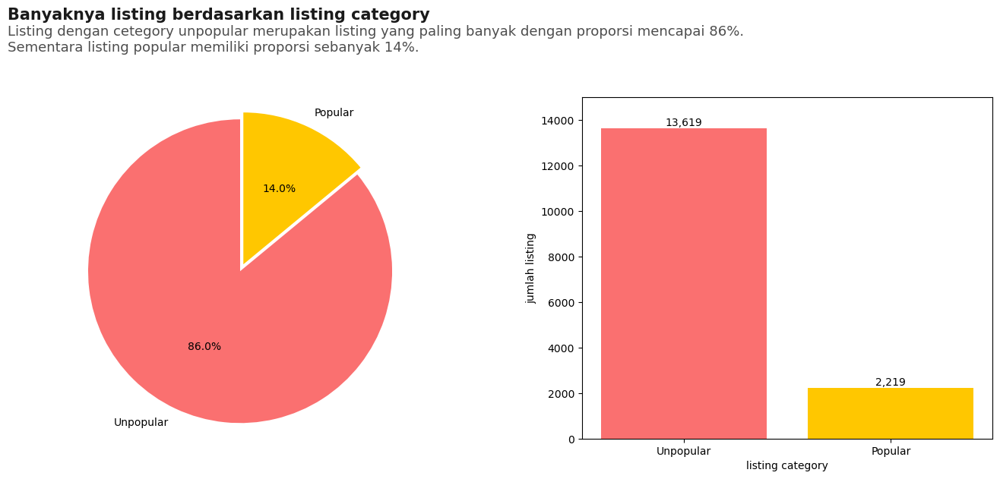

In [56]:
number_of_listing_category = df.groupby('listing_category', as_index=False)[['price']].count().sort_values('price', ascending=False)

# set axes and figure size
fig, axes = plt.subplots(1, 2, figsize=(18,6))

# create pie chart
axes[0].pie(
    number_of_listing_category['price'],
    colors=['#FA7070', '#FFC700'],
    labels=number_of_listing_category['listing_category'],
    autopct='%1.1f%%',
    startangle=90,
    pctdistance=0.55,
    explode=[0.025, 0.025]
)
# create bar chart
axes[1].bar(
    number_of_listing_category['listing_category'],
    number_of_listing_category['price'],
    color=['#FA7070', '#FFC700'],
)

# set value on bar chart
for i in axes[1].patches:
    value = '{:,.0f}'.format(i.get_height())
    x = i.get_x() + i.get_width()/2
    y = i.get_height() + 100
    axes[1].annotate(value, (x, y), ha='center')

# set axis label
axes[0].axis('equal')
axes[1].set(
    ylabel='jumlah listing',
    ylim=(0, 15000),
    xlabel='listing category'
)

# set position
axes[0].set_position([0.1, 0.05, 0.3, 0.75])
axes[1].set_position([0.5, 0.05, 0.3, 0.75])

# set title
fig.text(
    0.08,
    0.97,
    "Banyaknya listing berdasarkan listing category",
    color="#1a1a1a",
    fontsize=15,
    weight="bold"
)

subtitle = [
    "Listing dengan cetegory unpopular merupakan listing yang paling banyak dengan proporsi mencapai 86%.",
    "Sementara listing popular memiliki proporsi sebanyak 14%."
]
fig.text(
    0.08,
    0.90,
    "\n".join(subtitle),
    ha="left",
    color="#4d4d4d",
    fontsize=13,
)

# show
plt.show()

## **Analisis Data**

### Kolerasi Antara Data Numerikal

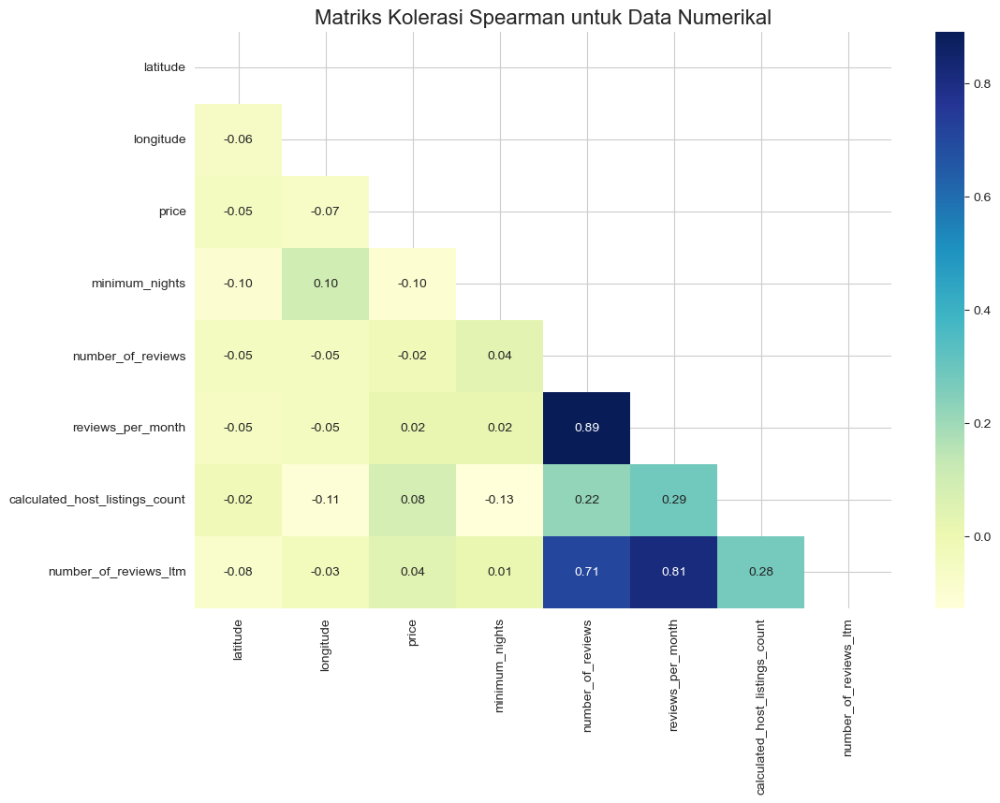

In [57]:
# Select numerical columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Calculate the Spearman correlation matrix
spearman_corr_matrix = df[numerical_cols].corr(method='spearman')

mask = np.triu(np.ones_like(spearman_corr_matrix, dtype=bool))
sns.set_style("whitegrid")
plt.figure(figsize=(12, 8))
sns.heatmap(spearman_corr_matrix, annot=True, cmap='YlGnBu', fmt=".2f", mask=mask)
plt.title('Matriks Kolerasi Spearman untuk Data Numerikal', fontsize=16)

plt.show()

> Korelasi Penting:
> - reviews_per_month dan number_of_reviews memiliki korelasi positif kuat (0.89), menunjukkan bahwa listing dengan lebih banyak ulasan cenderung memiliki lebih banyak ulasan per bulan.
> - reviews_per_month dan number_of_reviews_ltm menunjukkan korelasi positif kuat (0.71), yang menunjukkan bahwa jumlah ulasan per bulan berhubungan dengan total ulasan dalam dua belas bulan terakhir.
> - number_of_reviews dan number_of_reviews_ltm memiliki korelasi sempurna 0.81, menunjukkan bahwa total jumlah ulasan selaras erat dengan ulasan dalam dua belas bulan terakhir.
> - Sebagian besar variabel lainnya menunjukkan korelasi lemah satu sama lain.

### Analisis Fitur `price`

Pada analisis kolom `price` digunakan median sebagai pusat sebaran data, karena data pada kolom `price` tidak terdistribusi dengan normal. Sehingga pengaruh dari outlier terhadap analisis dapat diminimalisir.

#### Analisis `price` terhadap `listing_category`

Listing yang termasuk populer adalah listing yang memiliki review > 7.5 dalam 12 bulan terakhir. Nilai 7.5 didapatkan dari nilai batas atas untuk menentukan outlier pada kolom `number_of_review_ltm`. Selanjutnya, akan dianalisis apakah ada perbedaan signifikan antara harga listing populer dan tidak populer. Untuk pengujian ini digunakan **Mann-Whitney Test**.

Hipotesis:
- $H_0$ : median harga populer = median harga unpopuler
- $H_1$ : median harga populer != median harga unpopuler

In [58]:
from scipy.stats import mannwhitneyu

stat, pvalue = mannwhitneyu(
    x = df[df['listing_category'] == 'Popular']['price'],
    y = df[df['listing_category'] == 'Unpopular']['price'],
    alternative='two-sided'
)

alpha = 0.05

if pvalue > 0.05:
    print(f'''
          pvalue = {pvalue:.5f}. pvalue > {alpha}. Fail to reject Ho.
          Kita TIDAK punya cukup bukti untuk mengatakan bahwa median harga listing yang populer
          TIDAK SAMA dengan median harga listing yang tidak populer.
          ''')
else:
    print(f'''
          pvalue = {pvalue:.5f}. pvalue < {alpha}. Reject Ho.
          Kita punya cukup bukti untuk mengatakan bahwa median harga listing yang populer
          TIDAK SAMA dengan median harga listing yang tidak populer.
          ''')



          pvalue = 0.00000. pvalue < 0.05. Reject Ho.
          Kita punya cukup bukti untuk mengatakan bahwa median harga listing yang populer
          TIDAK SAMA dengan median harga listing yang tidak populer.
          


> Hasil uji menunjukkan signifikansi statistik, mengindikasikan bahwa secara signifikan terdapat perbedaan harga median antara listing populer dan tidak populer. Temuan ini menunjukkan bahwa popularitas terkait dengan perbedaan harga listing. Hal ini dapat menyiratkan bahwa listing populer cenderung memiliki harga yang berbeda (mungkin lebih tinggi atau lebih rendah) dibandingkan dengan listing yang tidak populer. Jika tujuannya adalah untuk memaksimalkan pendapatan, memahami faktor-faktor yang berkontribusi terhadap popularitas listing dapat bermanfaat. Strategi penetapan harga dapat disesuaikan berdasarkan wawasan ini agar selaras dengan tren pasar.

Untuk melihat perbedaan dengan lebih jelas, digunakan barplot untuk visualisasi data.

In [59]:
price_by_listing_cat = df.groupby('listing_category', as_index=False)[['price']].median().sort_values('price', ascending=False)
price_by_listing_cat

,listing_category,price
0,Popular,1623.0
1,Unpopular,1385.0


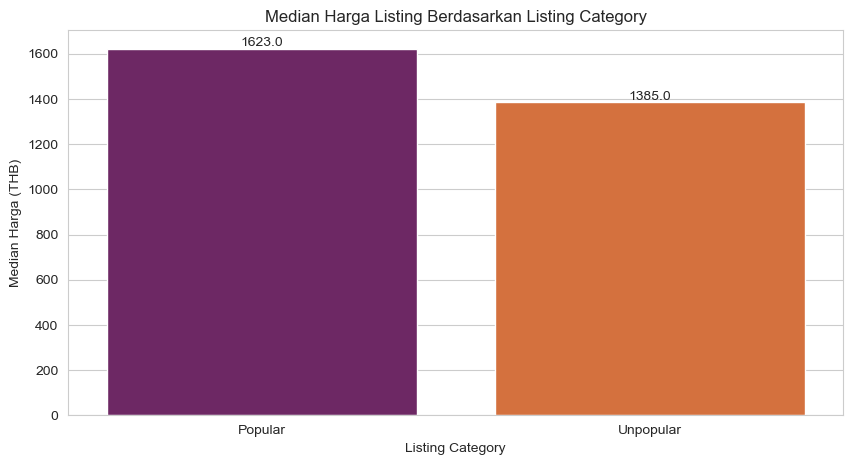

In [60]:
price_by_listing_cat = df.groupby('listing_category', as_index=False)[['price']].median().sort_values('price', ascending=False)
fig, ax = plt.subplots(figsize=(10,5))
ax = sns.barplot(data=price_by_listing_cat, x='listing_category', y='price', palette='inferno')
for bar in ax.patches:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center')

plt.title('Median Harga Listing Berdasarkan Listing Category')
plt.xlabel('Listing Category')
plt.ylabel('Median Harga (THB)')
plt.show()

Dari informasi yang tersebut, didapatkan perbedaan median harga antar listing yang `Popular` dan `Unpopular` yaitu sebesar 238 THB.

#### Analisis `price` terhadap `room_type`

Analisis harga berdasarkan tipe kamar membantu host untuk memahami pasar secara lebih baik. Dengan mengetahui tolak ukur harga untuk setiap tipe kamar, host dapat menyesuaikan harga mereka agar tetap kompetitif dan menarik bagi tamu.

Selanjutnya, akan dianalisis apakah ada perbedaan signifikan antara harga listing harian untuk setiap tipe kamar. Untuk pengujian ini digunakan **Kruskal-Wallis Test**.

Hipotesis:
- $H_0$ : Median harga harian untuk setiap tipe kamar adalah SAMA
- $H_1$ : Minimal ada 1 tipe kamar yang berbeda median harga hariannya. Tetapi kita tidak tahu yang mana.

In [61]:
from scipy.stats import kruskal

stat, pvalue = kruskal(
    df[df['room_type']=='Entire home/apt']['price'],
    df[df['room_type']=='Private room']['price'],
    df[df['room_type']=='Hotel room']['price'],
    df[df['room_type']=='Shared room']['price']
)

alpha = 0.05

if pvalue > alpha:
    print(f'''
          pvalue = {pvalue:.5f}. pvalue > {alpha}. Fail to reject Ho.
          Kita TIDAK punya cukup bukti untuk mengatakan bahwa minimal ada 1 tipe kamar yang median harga hariannya berbeda.
          Tetapi kita tidak tahu yang mana.
          ''')
else:
    print(f'''
          pvalue = {pvalue:.5f}. pvalue < {alpha}. Reject Ho.
          Kita punya cukup bukti untuk mengatakan bahwa minimal ada 1 tipe kamar yang median harga hariannya berbeda.
          Tetapi kita tidak tahu yang mana.
          ''')


          pvalue = 0.00000. pvalue < 0.05. Reject Ho.
          Kita punya cukup bukti untuk mengatakan bahwa minimal ada 1 tipe kamar yang median harga hariannya berbeda.
          Tetapi kita tidak tahu yang mana.
          


Dari **Kruskal-Wallis test** diketahui bahwa terdapat minimal ada 1 tipe kamar yang median harga hariannya berbeda, tetapi kita tidak tahu yang mana. Hal ini berarti terdapat signifikansi antara variabel `price` dan `room_type`.

Kita juga dapat mengetahui median harga harian dari tiap tipe kamar dalam bentuk barplot.

In [62]:
room_type_price = df.groupby('room_type', as_index=False)[['price']].median().sort_values('price', ascending=False)
room_type_price

,room_type,price
1,Hotel room,1700.0
0,Entire home/apt,1535.0
2,Private room,1212.0
3,Shared room,500.0


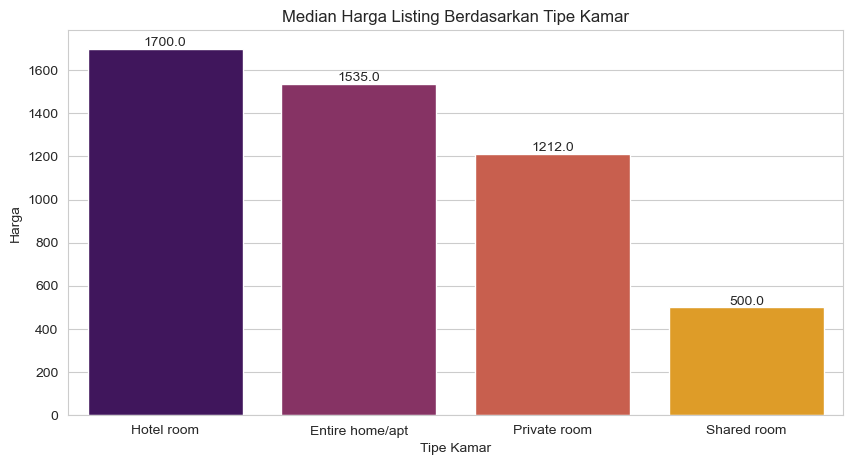

In [63]:
fig, ax = plt.subplots(figsize=(10,5))

ax = sns.barplot(data=room_type_price, x='room_type', y='price', palette='inferno')
for bar in ax.patches:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center')

plt.title('Median Harga Listing Berdasarkan Tipe Kamar')
plt.xlabel('Tipe Kamar')
plt.ylabel('Harga')
plt.show()

Berdasarkan data yang diberikan, tipe kamar yang paling ekonomis (dengan harga median harian terendah) adalah:

Shared room: THB 500 / malam

Dan listing dengan tipe kamar paling mahal adalah:

Hotel room: THB 1700 / malam

Perbedaan harga ini dapat digunakan untuk strategi penetapan harga atau pengelolaan inventaris, menargetkan tipe kamar yang lebih mahal atau lebih murah berdasarkan permintaan pasar.

#### Analisis `price` terhadap `price_category`

Listing dikategorikan menjadi **Budget, Mid-range, Luxury** berdasarkan dari harga sewa per malamnya. Untuk yang harga sewanya <= THB 1000 dikategorikan sebagai listing **Budget**, listing <= THB 3000 dikatorikan sebagai **Mid-range** dan untuk harga yang di atasnya dikategorikan sebagai listing **Luxury**.

Selanjutnya, akan dianalisis apakah ada perbedaan signifikan antara harga listing harian untuk setiap kategori harga. Untuk pengujian ini digunakan **Kruskal-Wallis Test**.

Hipotesis:
- $H_0$ : Median harga untuk setiap kategori harga listing SAMA
- $H_1$ : Minimal ada 1 kategori harga listing yang berbeda median harga hariannya. Tetapi kita tidak tahu yang mana.

In [64]:
from scipy.stats import kruskal

stat, pvalue = kruskal(
    df[df['price_category']=='Budget']['price'],
    df[df['price_category']=='Mid-range']['price'],
    df[df['price_category']=='Luxury']['price']
)

alpha = 0.05

if pvalue > alpha:
    print(f'''
          pvalue = {pvalue:.5f}. pvalue > {alpha}. Fail to reject Ho.
          Kita TIDAK punya cukup bukti untuk mengatakan bahwa minimal ada 1 tipe kamar yang median harga hariannya berbeda.
          Tetapi kita tidak tahu yang mana.
          ''')
else:
    print(f'''
          pvalue = {pvalue:.5f}. pvalue < {alpha}. Reject Ho.
          Kita punya cukup bukti untuk mengatakan bahwa minimal ada 1 tipe kamar yang median harga hariannya berbeda.
          Tetapi kita tidak tahu yang mana.
          ''')


          pvalue = 0.00000. pvalue < 0.05. Reject Ho.
          Kita punya cukup bukti untuk mengatakan bahwa minimal ada 1 tipe kamar yang median harga hariannya berbeda.
          Tetapi kita tidak tahu yang mana.
          


Dari **Kruskal-Wallis test** diketahui bahwa terdapat minimal ada 1 kategori listing berdasarkan harga yang median harga hariannya berbeda, tetapi kita tidak tahu yang mana. Hal ini berarti terdapat signifikansi antara variabel `price` dan `price_cetegory`.

Kita juga dapat mengetahui median harga harian dari tiap kategori harga listing dalam bentuk barplot.

In [65]:
price_category_by_price = df.groupby('price_category', as_index=False)[['price']].median().sort_values('price', ascending=False)
price_category_by_price

,price_category,price
1,Luxury,4771.0
2,Mid-range,1590.0
0,Budget,750.0


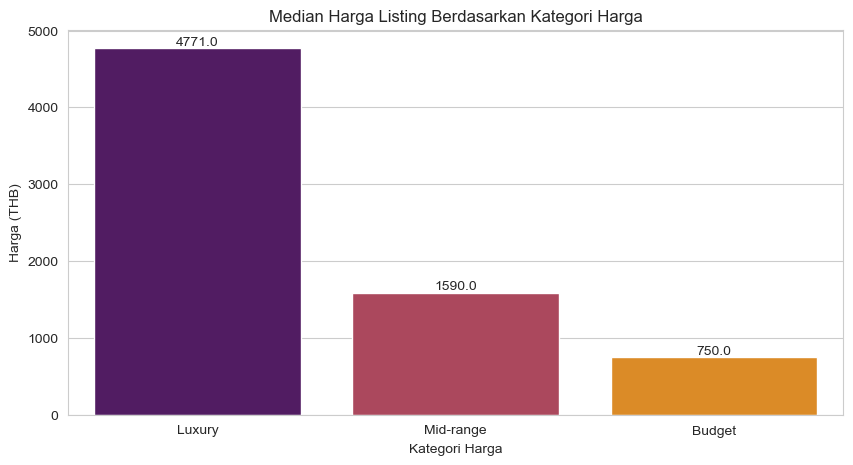

In [66]:
fig, ax = plt.subplots(figsize=(10,5))

ax = sns.barplot(data=price_category_by_price, x='price_category', y='price', palette='inferno')
for bar in ax.patches:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center')

plt.title('Median Harga Listing Berdasarkan Kategori Harga')
plt.xlabel('Kategori Harga')
plt.ylabel('Harga (THB)')
plt.show()

Dari informasi yang didapatkan, listing dengan kategori **Luxury** memiliki median harga lebih tinggi dibanding dengan tipe listing yang lain, yaitu THB 4771. Hal ini bisa disebabkan dari fasiltas yang diberikan oleh host premium dan personal yang dapat disesuaikan dengan preferensi tamu. Untuk tamu yang membutuhkan privasi lebih dan fasilitas yang lebih personal dapat memilih listing dengan kategori **Luxury**. Sedangkan untuk backpacker dengan budget yang minim, dapat memilih listing di kategori **Budget** dengan median harga THB 750. Ini cocok karena dapat menghemat budget untuk penginapan.

#### Analisis `price` terhadap `review_category`

Pada tahapan ini, akan dilihat apakah terdapat pengaruh antara listing dengan kategori review tertentu dengan median harga listing tersebut. Kategori review sendiri dibagi menjadi 3 yaitu, **Highly Reviewed** untuk listing yang memiliki jumlah review > 20, **Moderately Reviewed** untuk listing yang memiliki review <= 20, dan **No Review** untuk listing yang belum memiliki review dan dianggap sebagai listing yang baru.

Selanjutnya, akan dianalisis apakah ada perbedaan signifikan antara harga listing harian untuk setiap kategori ulasan. Untuk pengujian ini digunakan **Kruskal-Wallis Test**.

Hipotesis:
- $H_0$ : Median harga harian untuk setiap kategori review adalah SAMA
- $H_1$ : Minimal ada 1 kategori review yang berbeda median harga hariannya. Tetapi kita tidak tahu yang mana.

In [67]:
from scipy.stats import kruskal

stat, pvalue = kruskal(
    df[df['review_category']=='Highly Reviewed']['price'],
    df[df['review_category']=='Moderately Reviewed']['price'],
    df[df['review_category']=='No Review']['price']
)

alpha = 0.05

if pvalue > alpha:
    print(f'''
          pvalue = {pvalue:.5f}. pvalue > {alpha}. Fail to reject Ho.
          Kita TIDAK punya cukup bukti untuk mengatakan bahwa minimal ada 1 tipe kamar yang median harga hariannya berbeda.
          Tetapi kita tidak tahu yang mana.
          ''')
else:
    print(f'''
          pvalue = {pvalue:.5f}. pvalue < {alpha}. Reject Ho.
          Kita punya cukup bukti untuk mengatakan bahwa minimal ada 1 tipe kamar yang median harga hariannya berbeda.
          Tetapi kita tidak tahu yang mana.
          ''')


          pvalue = 0.00000. pvalue < 0.05. Reject Ho.
          Kita punya cukup bukti untuk mengatakan bahwa minimal ada 1 tipe kamar yang median harga hariannya berbeda.
          Tetapi kita tidak tahu yang mana.
          


Dari **Kruskal-Wallis test** diketahui bahwa terdapat minimal ada 1 kategori listing berdasarkan jumlah review yang median harga hariannya berbeda, tetapi kita tidak tahu yang mana. Hal ini berarti terdapat signifikansi antara variabel `price` dan `review_cetegory`.

Kita juga dapat mengetahui median harga harian dari tiap kategori review listing dalam bentuk barplot.

In [68]:
review_category_by_price = df.groupby('review_category', as_index=False)[['price']].median().sort_values('price', ascending=False)
review_category_by_price

,review_category,price
2,No Review,1500.0
0,Highly Reviewed,1466.0
1,Moderately Reviewed,1350.0


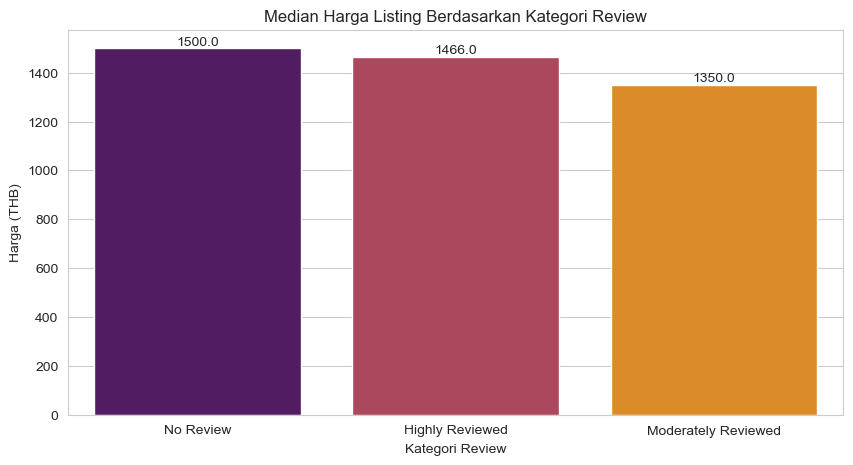

In [69]:
fig, ax = plt.subplots(figsize=(10,5))

ax = sns.barplot(data=review_category_by_price, x='review_category', y='price', palette='inferno')
for bar in ax.patches:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center')

plt.title('Median Harga Listing Berdasarkan Kategori Review')
plt.xlabel('Kategori Review')
plt.ylabel('Harga (THB)')
plt.show()

Dari informasi di atas, diketahui bahwa median harga listing yang dikelompokkan berdasarkan jumlah review memiliki perbedaan. Listing dengan kategori **Highly Reviewed** memiliki median harga THB 1466 dan memiliki selisih THB 116 dengan listing dalam kategori **Moderately Reviewed**. Untuk listing baru yang belum memiliki review, median harga hariannya yaitu THB 1500, lebih tinggi sebesar THB 34 dari nilai median listing **Highly Reviewed**.

### Analisis Fitur `listing_category`

#### Analisis `listing_category` terhadap `room_type`

In [70]:
import plotly.express as px    
import plotly.graph_objects as go 
from plotly.subplots import make_subplots

In [71]:
fig=px.sunburst(df,path=['listing_category','room_type'],color='listing_category', title=f'Proporsi listing category Berdasarkan room_type')
fig.show()

Untuk melihat apakah terdapat hubungan antara listing category dengan room type, digunakan **Chi-squared Test** karena kedua data ini merupakan kategorikal.

Hipotesis:

- $H_0$ : Proporsi antara 'Entire home/apt', 'Private room', 'Hotel room', dan 'Shared room' dengan label pada `listing category` sama besar (tidak ada hubungan antara `room_type` dengan `listing category`)

- $H_1$ : Setidaknya ada satu pasang proporsi yang berbeda (ada hubungan antara `room_type` dengan `listing category`)

In [72]:
cross_tab = pd.crosstab(df['room_type'], df['listing_category'])
cross_tab.reset_index()
cross_tab

listing_category,Popular,Unpopular
room_type,,
Entire home/apt,1838,7068
Hotel room,40,609
Private room,333,5428
Shared room,8,514


In [73]:
import scipy.stats as stats
from scipy.stats import chi2_contingency

stat, pvalue, dof, expected_freq = stats.chi2_contingency(cross_tab)
# chi2_contingency(cross_tab)[1]
# print('p-value =', p_val)
alpha = 0.05

if pvalue > alpha:
    print(f'''
    pvalue = {pvalue:.5f}. pvalue > {alpha}. Fail to reject Ho.
    Kita TIDAK punya cukup bukti untuk mengatakan bahwa antara tipe kamar dan listing category ada keterkaitan (dependent).          
    ''')
else:
    print(f'''
    pvalue = {pvalue:.5f}. pvalue <= {alpha}. Reject Ho.
    Kita punya cukup bukti untuk mengatakan bahwa antara tipe kamar dan listing category ada keterkaitan (dependent).         
    ''')


    pvalue = 0.00000. pvalue <= 0.05. Reject Ho.
    Kita punya cukup bukti untuk mengatakan bahwa antara tipe kamar dan listing category ada keterkaitan (dependent).         
    


Dari uji Chi-squared, disimpulkan bahwa ada perbedaan signifikan antara proporsi `room_type` berdasarkan `listing_category`. Berarti, dapat kita simpulkan bahwa `room_type` memengaruhi `listing_category`.

Untuk dapat mengetahui pasangan mana yang berbeda, kita harus melakukan post-hoc test. Namun, demi kepentingan analisis ini, kita hanya cukup mengetahui apakah kedua variabel tersebut saling independen atau dependen.

In [74]:
list_cat_by_room = df.groupby('listing_category', as_index=False)[['room_type']].value_counts().sort_values('listing_category', ascending=False)
list_cat_by_room

,listing_category,room_type,count
4,Unpopular,Entire home/apt,7068
5,Unpopular,Private room,5428
6,Unpopular,Hotel room,609
7,Unpopular,Shared room,514
0,Popular,Entire home/apt,1838
1,Popular,Private room,333
2,Popular,Hotel room,40
3,Popular,Shared room,8


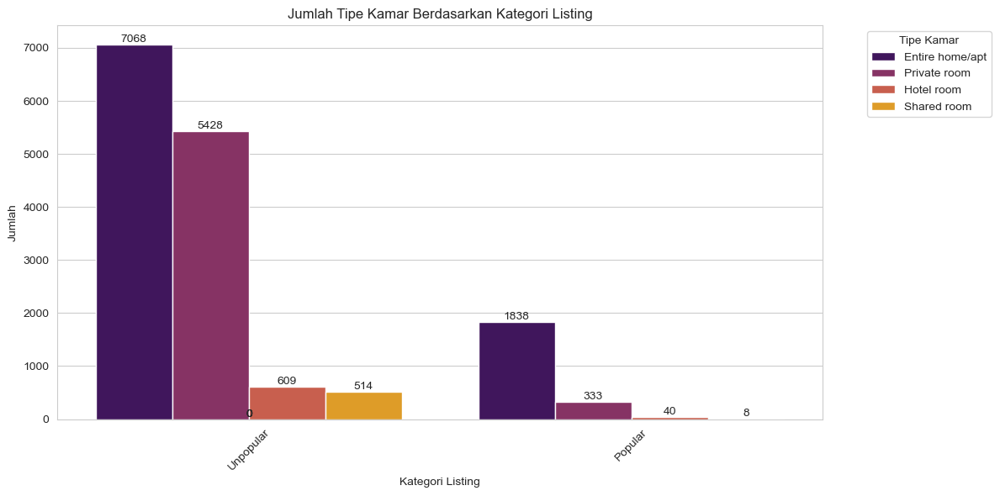

In [75]:
fig, ax = plt.subplots(figsize=(12, 6))

sns.barplot(data=list_cat_by_room, x='listing_category', y='count', hue='room_type', palette='inferno', ax=ax)

# Adding annotations on each bar
for bar in ax.patches:
    yval = bar.get_height()
    if not pd.isna(yval):
        ax.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')

ax.set_title('Jumlah Tipe Kamar Berdasarkan Kategori Listing')
ax.set_xlabel('Kategori Listing')
ax.set_ylabel('Jumlah')
plt.xticks(rotation=45)
plt.legend(title='Tipe Kamar', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

#### Analisis `listing_category` terhadap `review_category`

In [76]:
fig=px.sunburst(df,path=['listing_category','review_category'],color='listing_category', title=f'Proporsi listing category Berdasarkan review_category')
fig.show()

Untuk melihat apakah terdapat hubungan antara listing category dengan review category, digunakan **Chi-squared Test** karena kedua data ini merupakan kategorikal.

Hipotesis:

- $H_0$ : Proporsi antara listing yang memiliki kategori review **Highly Reviewed**, **Moderately Reviewed**, dan **No Review** dengan label pada `listing_category` sama besar (tidak ada hubungan antara `review_category` dengan `listing category`)

- $H_1$ : Setidaknya ada satu pasang proporsi yang berbeda (ada hubungan antara `review_category` dengan `listing category`)

In [77]:
cross_tab = pd.crosstab(df['review_category'], df['listing_category'])
cross_tab

listing_category,Popular,Unpopular
review_category,,
Highly Reviewed,1473,1634
Moderately Reviewed,746,6209
No Review,0,5776


In [78]:
import scipy.stats as stats
from scipy.stats import chi2_contingency

stat, pvalue, dof, expected_freq = stats.chi2_contingency(cross_tab)
alpha = 0.05

if pvalue > alpha:
    print(f'''
    pvalue = {pvalue:.5f}. pvalue > {alpha}. Fail to reject Ho.
    Kita TIDAK punya cukup bukti untuk mengatakan bahwa antara review category dan listing category ada keterkaitan (dependent).          
    ''')
else:
    print(f'''
    pvalue = {pvalue:.5f}. pvalue <= {alpha}. Reject Ho.
    Kita punya cukup bukti untuk mengatakan bahwa antara review category dan listing category ada keterkaitan (dependent).         
    ''')


    pvalue = 0.00000. pvalue <= 0.05. Reject Ho.
    Kita punya cukup bukti untuk mengatakan bahwa antara review category dan listing category ada keterkaitan (dependent).         
    


Dari uji Chi-squared, disimpulkan bahwa ada perbedaan signifikan antara proporsi `review_category` berdasarkan `listing_category`. Berarti, dapat kita simpulkan bahwa `review_category` memengaruhi `listing_category`. Di mana ketika suatu listing memiliki review yang banyak selama 12 bulan terakhir, maka listing tersebut dapat dilabeli dengan listing yang populer.

Untuk dapat mengetahui pasangan mana yang berbeda, kita harus melakukan post-hoc test. Namun, demi kepentingan analisis ini, kita hanya cukup mengetahui apakah kedua variabel tersebut saling independen atau dependen.

In [79]:
list_cat_by_review = df.groupby('listing_category', as_index=False)[['review_category']].value_counts().sort_values('listing_category', ascending=False)
list_cat_by_review

,listing_category,review_category,count
2,Unpopular,Moderately Reviewed,6209
3,Unpopular,No Review,5776
4,Unpopular,Highly Reviewed,1634
0,Popular,Highly Reviewed,1473
1,Popular,Moderately Reviewed,746


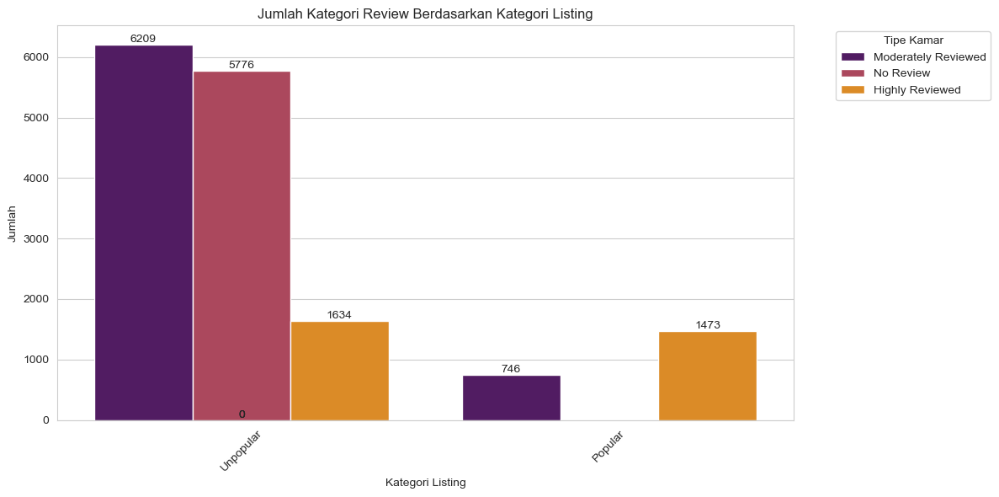

In [80]:
fig, ax = plt.subplots(figsize=(12, 6))

sns.barplot(data=list_cat_by_review, x='listing_category', y='count', hue='review_category', palette='inferno', ax=ax)

# Adding annotations on each bar
for bar in ax.patches:
    yval = bar.get_height()
    if not pd.isna(yval):
        ax.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')

ax.set_title('Jumlah Kategori Review Berdasarkan Kategori Listing')
ax.set_xlabel('Kategori Listing')
ax.set_ylabel('Jumlah')
plt.xticks(rotation=45)
plt.legend(title='Tipe Kamar', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

### Analisis Fitur `district`

Analisis jumlah listing berdasarkan district membantu host untuk memahami permintaan pasar di setiap `district`. Dengan mengetahui bagaimana harga yang bervariasi di berbagai distrik, host dapat menyesuaikan harga mereka untuk memaksimalkan pendapatnya sesuai dengan jumlah permintaan. Informasi tentang jumlah listing dan harga di setiap district juga memungkinkan host untuk menyesuaikan strategi harga mereka secara lebih efektif. Mereka dapat menetapkan harga yang lebih kompetitif di daerah dengan persaingan yang ketat atau harga yang lebih tinggi di daerah yang memiliki permintaan yang tinggi.

#### Distribusi `district` Berdasarkan Jumlah Listing

In [81]:
import folium

basemaps = {
    'Google Maps': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=m&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Maps',
        overlay = True,
        control = True
    )
}

In [82]:
from folium.plugins import HeatMap

district_by_listing = df['district'].value_counts()

# Create a map centered around the mean latitude and longitude
mean_lat = df['latitude'].mean()
mean_lon = df['longitude'].mean()
maps_bkk = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Get the mean latitude and longitude per district for heatmap
heatmap_data = []
for district, count in district_by_listing.items():
    subset = df[df['district'] == district]
    district_lat = subset['latitude'].mean()
    district_lon = subset['longitude'].mean()
    heatmap_data.append([district_lat, district_lon, count])

# Create a HeatMap
basemaps['Google Maps'].add_to(maps_bkk)
HeatMap(heatmap_data).add_to(maps_bkk)

# Display the map
maps_bkk

In [83]:
district_by_listing = df['district'].value_counts()

heatmap_data = []
for district, count in district_by_listing.items():
    subset = df[df['district'] == district]
    district_lat = subset['latitude'].mean()
    district_lon = subset['longitude'].mean()
    heatmap_data.append([district, district_lat, district_lon, count])

columns = ['district', 'district Latitude', 'district Longitude', 'Booking Frequency']
df_district = pd.DataFrame(heatmap_data, columns=columns)

df_district

,district,district Latitude,district Longitude,Booking Frequency
0,Vadhana,13.734653,100.574603,2150
1,Khlong Toei,13.723056,100.573001,2097
2,Huai Khwang,13.765790,100.576866,1123
3,Ratchathewi,13.752983,100.543623,1113
4,Bang Rak,13.726150,100.525398,827
5,Sathon,13.715766,100.529234,806
6,Phra Nakhon,13.757998,100.499504,618
7,Phra Khanong,13.694849,100.608020,557
8,Chatu Chak,13.818084,100.568098,548
9,Bang Na,13.670636,100.615146,457


Heatmap mengungkapkan area dengan kepadatan listing Airbnb yang tinggi, yang mungkin berkorelasi dengan area wisata atau komersial yang populer. Dengan memeriksa data harga pada peta, kita dapat mengidentifikasi distrik mana yang memiliki median harga lebih tinggi atau lebih rendah.

Memahami distribusi geografis dapat membantu dalam pengambilan keputusan strategis, seperti mengoptimalkan penetapan harga listing berdasarkan lokasi dan menargetkan upaya pemasaran ke area dengan permintaan tinggi.

**Top 5 Distrik Berdasarkan Jumlah Listing**

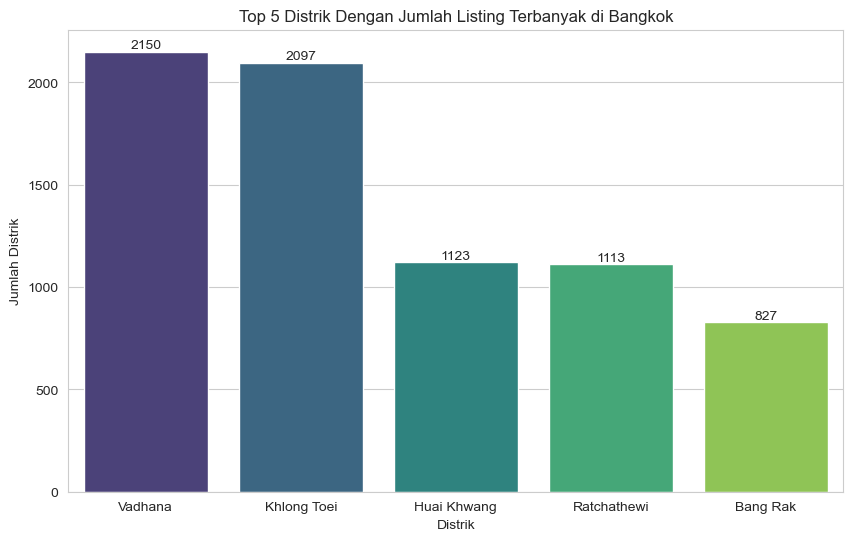

In [84]:
# Count the number of listings per district
district_counts = df['district'].value_counts()

# Select the top 5 districts with the most listings
top_5_districts = district_counts.head(5)

# Create a bar plot for the top 5 districts with annotations for each bar
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=top_5_districts.index, y=top_5_districts.values, palette='viridis')

# Annotate the bars with their values
for bar in barplot.patches:
    yval = bar.get_height()
    barplot.text(
        bar.get_x() + bar.get_width() / 2, 
        yval, 
        int(yval), 
        va='bottom', 
        ha='center'
    )

plt.title('Top 5 Distrik Dengan Jumlah Listing Terbanyak di Bangkok')
plt.xlabel('Distrik')
plt.ylabel('Jumlah Distrik')
plt.show()


> Distrik dengan jumlah listing paling banyak adalah sebagai berikut:

> - Vadhana: 2,150 listing
> - Khlong Toei: 2,097 listing
> - Huai Khwang: 1,123 listing
> - Ratchathewi: 1,113 listing
> - Bang Rak: 827 listing

> Banyak listing yang berada di distrik tersebut mengindikasikan bahwa daerah tersebut **populer dikalangan wisatawan** atau distrik-distrik tersebut **memiliki akses yang baik ke transportasi umum**. Seperti distrik Vadhana yang terletak di pusat dan terdapat stasiun BTS Skytrain. Ini dapat menarik antusias wisatawan.

> Distrik Vadhana dan Khlong Toei memiliki jumlah listing yang hampir 2x lebih banyak dari distrik Huai Khwang dan Ratchathewi, ini dapat mengindikasikan bahwa distrik tersebut memiliki potensi tempat wisata dengan pilihan atraksi, fasilitas, dan pilihan transportasi yang beragam. Seperti di Khlong Toei dekat dengan atraksi seperti Taman Benjakitti dan Pusat Konvensi Nasional Ratu Sirikit.

> Dari distribusi secara geografi, distrik-distrik di pusat kota Bangkok memiliki jumlah listing yang lebih banyak dibandingkan distrik yang di pinggiran kota. Hal ini mengindikasikan bahwa kecenderungan wisatawan untuk mengunjungi tempat-tempat yang berada di daerah tengah kota.

> Distrik-distrik ini menarik banyak listing karena lokasi strategis, aksesibilitas, fasilitas yang beragam, dan berbagai pilihan akomodasi yang tersedia. Kombinasi atraksi budaya, bisnis, dan hiburan membuatnya diinginkan bagi wisatawan dan pelancong bisnis. Memahami faktor-faktor ini dapat membantu dalam menargetkan upaya pemasaran dan meningkatkan daya tarik listing di area tersebut.

#### Analisis `price` terhadap `district`

In [85]:
median_price_district = df.groupby('district')['price'].median().reset_index()
mean_point_district = df.groupby('district')[['latitude', 'longitude']].mean().reset_index()

# Merge the median price DataFrame with the mean latitude and longitude DataFrame
median_price_district = pd.merge(median_price_district, mean_point_district, on='district').sort_values(by='price', ascending=False)
median_price_district

,district,price,latitude,longitude
27,Nong Chok,2539.0,13.830064,100.848699
29,Parthum Wan,2400.0,13.742070,100.537411
47,Vadhana,2000.0,13.734653,100.574603
39,Samphanthawong,2000.0,13.736918,100.511237
8,Bang Rak,1850.0,13.726150,100.525398
34,Pom Prap Sattru Phai,1709.0,13.747014,100.511395
22,Khlong Toei,1700.0,13.723056,100.573001
37,Ratchathewi,1536.0,13.752983,100.543623
43,Taling Chan,1502.5,13.776295,100.437456
25,Lat Phrao,1500.0,13.820301,100.606542


Kita menggunakan data tambahan dari [Bangkok-districts.geojson](https://github.com/pcrete/gsvloader-demo/blob/master/geojson/Bangkok-districts.geojson) untuk menambahkan batas-batas dari tiap district di Bangkok.

In [86]:
bkk_geojson = 'Bangkok-districts.geojson'
bkk_location = [13.7563, 100.5018]

bkk_map = folium.Map(location = bkk_location, zoom_start = 11)

folium.Choropleth(
    geo_data = bkk_geojson,
    data = median_price_district,
    columns = ['district','price'],
    key_on = 'feature.properties.dname_e',
    legend_name = 'Median Price'
).add_to(bkk_map)

for idx, row in median_price_district.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"District: {row['district']}<br>Median Price: {row['price']}",
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(bkk_map)
basemaps['Google Maps'].add_to(bkk_map)
bkk_map

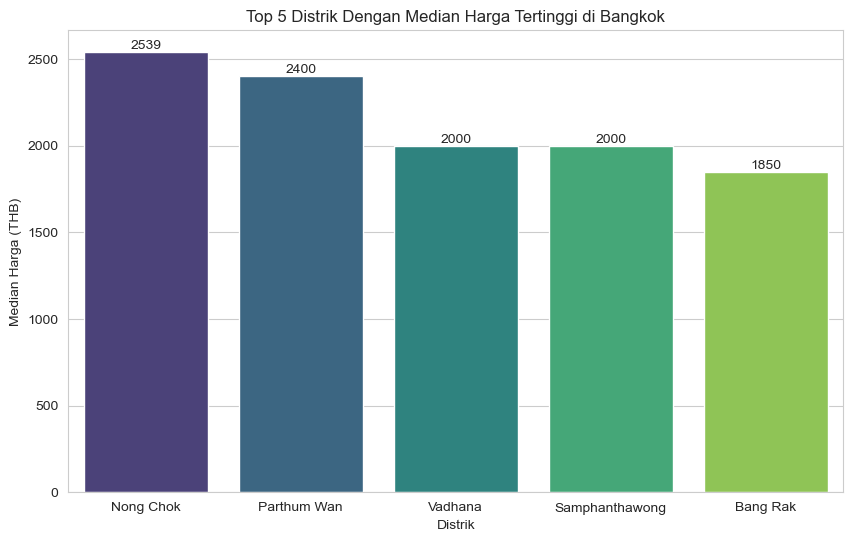

In [87]:
# Count the number of listings per district
median_price_district = df.groupby('district', as_index=False)['price'].median().sort_values('price', ascending=False)

# Select the top 5 districts with the most listings
top_5_median_price = median_price_district.head(5)

# Create a bar plot for the top 5 districts with annotations for each bar
plt.figure(figsize=(10, 6))
barplot = sns.barplot(data=top_5_median_price, x='district', y='price', palette='viridis')

# Annotate the bars with their values
for bar in barplot.patches:
    yval = bar.get_height()
    barplot.text(
        bar.get_x() + bar.get_width() / 2, 
        yval, 
        int(yval), 
        va='bottom', 
        ha='center'
    )

plt.title('Top 5 Distrik Dengan Median Harga Tertinggi di Bangkok')
plt.xlabel('Distrik')
plt.ylabel('Median Harga (THB)')
plt.show()

> Distrik dengan harga median tertinggi cenderung berada di lokasi yang sentral atau memiliki atraksi khusus yang mendorong permintaan, seperti pusat perbelanjaan, pusat bisnis, atau situs budaya. Pathum Wan dikenal karena lokasinya yang sentral dan kedekatannya dengan pusat perbelanjaan besar dan area bisnis, yang kemungkinan mendorong harga median naik. Distrik ini populer di kalangan turis dan pelaku bisnis yang mencari kenyamanan dan aksesibilitas.

> Faktor-faktor yang kemungkinan mempengaruhi harga ini termasuk kedekatan dengan atraksi wisata, pusat bisnis, pusat transportasi, dan fasilitas gaya hidup yang tersedia di area tersebut. Vadhana adalah distrik yang memiliki koneksi transportasi baik dengan banyak fasilitas dan gaya hidup yang dinamis, menarik ekspatriat dan profesional muda. Harga yang kompetitif menunjukkan keseimbangan antara permintaan dan penawaran yang tinggi.

> Harga median yang tinggi menunjukkan bahwa area ini adalah pasar yang kompetitif, mungkin memerlukan listing untuk menawarkan fasilitas atau pengalaman premium guna membenarkan biaya yang lebih tinggi. Seperti Nong Chok memiliki harga median tertinggi di antara distrik yang terdaftar, menunjukkan bahwa mungkin ada permintaan yang lebih tinggi untuk jenis akomodasi tertentu, mungkin karena listing mewah atau ketersediaan yang terbatas.

#### Analisis `district` dan `listing_category`

Pada analisis ini, dilihat bagaimana distribusi listing dengan kategori **Popular** di Bangkok. Dari informasi yang didapatkan dapat digunakan untuk mengidentifikasi lingkungan yang paling diminati oleh tamu, serta faktor-faktor apa yang membuatnya menarik bagi tamu.

In [88]:
# Load the geojson file for Bangkok districts
bkk_geojson = 'Bangkok-districts.geojson'

# Create a map centered around Bangkok
bkk_maps = folium.Map(location=[13.7563, 100.5018], zoom_start=10)

# Add GeoJSON boundaries of Bangkok districts
folium.GeoJson(
    bkk_geojson,
    name='geojson',
    style_function=lambda feature: {
        'fillColor': 'transparent',
        'color': 'blue',
        'weight': 1,
        'fillOpacity': 0
    },
    tooltip=folium.GeoJsonTooltip(fields=['dname_e'], aliases=['District'])
).add_to(bkk_maps)

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Determine marker color based on popularity
    if row['listing_category'] == 'Popular':
        fill_color = 'green'
        folium.Circle(
        location=[row['latitude'], row['longitude']],
        radius=100,  # Adjust the radius as needed
        color=fill_color,  # Border color
        fill=True,
        fill_color=fill_color,
        fill_opacity=0.6
    ).add_to(bkk_maps)

# Show the map
basemaps['Google Maps'].add_to(bkk_maps)
bkk_maps

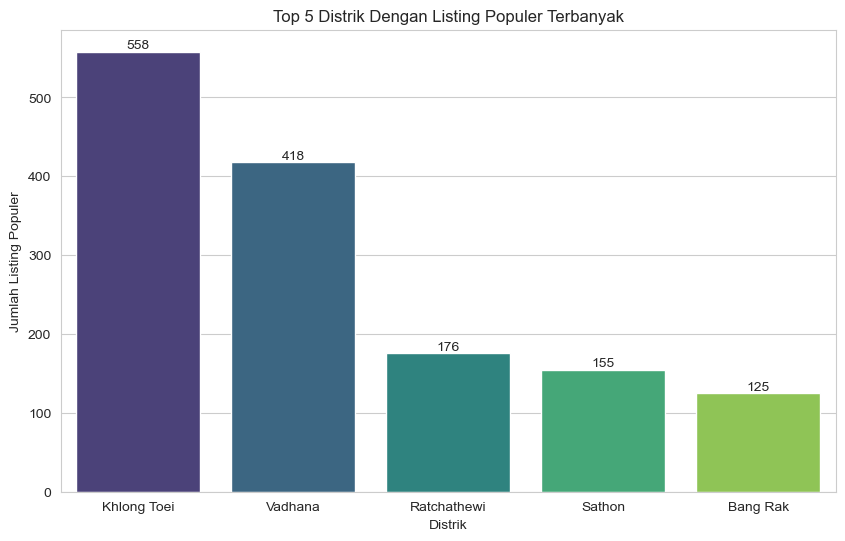

In [89]:
listing_pop = df[df['listing_category']== 'Popular']
district_pop = listing_pop['district'].value_counts().head()
district_pop_df = district_pop.reset_index()
district_pop_df.columns = ['district', 'count']

# Create a bar plot for the top 5 districts with annotations for each bar
plt.figure(figsize=(10, 6))
barplot = sns.barplot(data=district_pop_df, x='district', y='count', palette='viridis')

# Annotate the bars with their values
for bar in barplot.patches:
    yval = bar.get_height()
    barplot.text(
        bar.get_x() + bar.get_width() / 2, 
        yval, 
        int(yval), 
        va='bottom', 
        ha='center'
    )

plt.title('Top 5 Distrik Dengan Listing Populer Terbanyak')
plt.xlabel('Distrik')
plt.ylabel('Jumlah Listing Populer')
plt.show()

Dari map tersebut, kita dapat ketahui bahwa:
* Listing yang populer mayoritas terletak di pusat kota, khususnya di distrik Khloeng Toei, Vadhana, Ratchathewi, Sathon, Bang Rak. Distrik tersebut memang terkenal dengan pusat hiburan seperti *night market*, *night club*, pusat perbelanjaan, bar, dan hiburan lainnya.
* Selain di pusat kota, listing populer juga ditemukan di sekitar bandara Internasional Don Mueang (distrik Don Mueang) dan bandara Suvarnabhumi (distrik Bang Phli yang terletak di luar Bangkok).


Kecenderungan popularitas berdasarkan `district` dapat memberikan pandangan tentang permintaan yang lebih tinggi atau lebih rendah di wilayah tertentu. Dengan memahami dinamika ini, host Airbnb dapat menyesuaikan harga mereka secara lebih akurat. Mereka dapat menetapkan harga yang lebih tinggi di distrik dengan popularitas tinggi, sementara mungkin menawarkan harga yang lebih kompetitif di daerah-daerah yang kurang diminati. Hal ini dapat membantu meningkatkan pendapatan dengan memaksimalkan margin keuntungan.

#### Analisis `room_type` dan `district`

In [90]:
room_type_counts = df.groupby(['district', 'room_type']).size().reset_index(name='count').sort_values('count', ascending=False)
room_type_counts

,district,room_type,count
74,Khlong Toei,Entire home/apt,1520
157,Vadhana,Entire home/apt,1451
62,Huai Khwang,Entire home/apt,774
125,Ratchathewi,Entire home/apt,656
138,Sathon,Entire home/apt,554
...,...,...,...
12,Bang Khen,Shared room,1
7,Bang Khae,Hotel room,1
100,Phasi Charoen,Hotel room,1
3,Bang Kapi,Hotel room,1


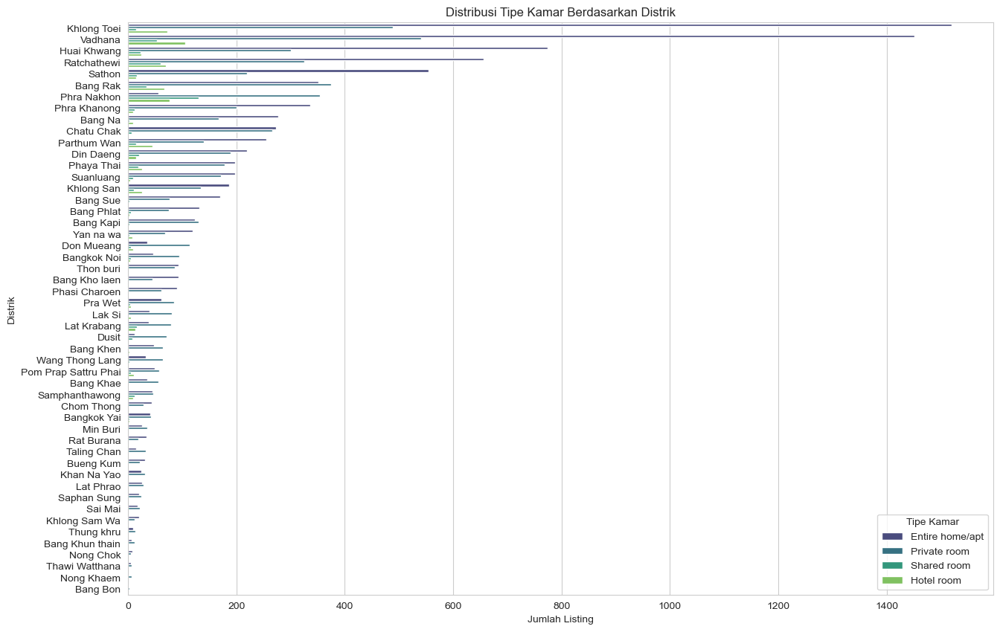

In [91]:
# Group by district and room type, and count the number of listings
room_type_counts = df.groupby(['district', 'room_type']).size().reset_index(name='count').sort_values('count', ascending=False)

# Plot the distribution of room types by district
plt.figure(figsize=(15, 10))
sns.barplot(data=room_type_counts, y='district', x='count', hue='room_type', palette='viridis')
plt.title('Distribusi Tipe Kamar Berdasarkan Distrik')
plt.ylabel('Distrik')
plt.xlabel('Jumlah Listing')
plt.legend(title='Tipe Kamar')
plt.show()

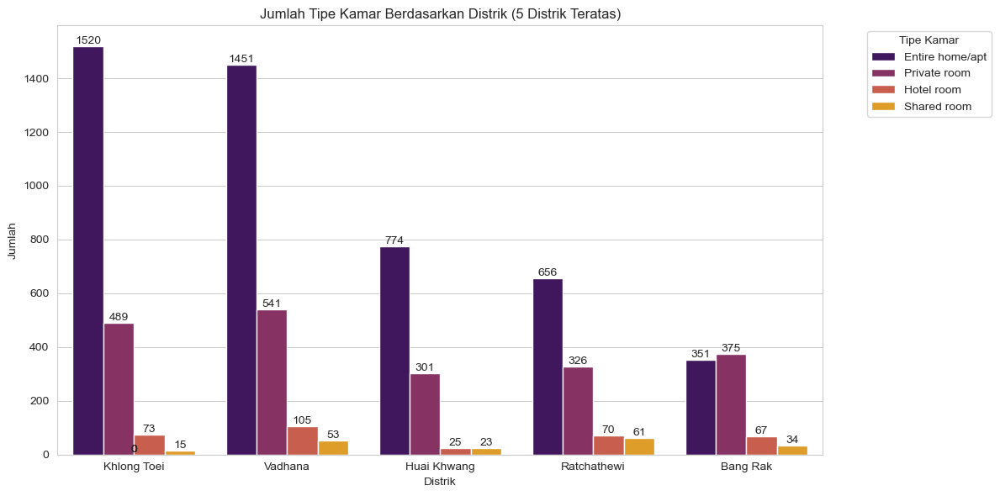

In [92]:
# Group by district and room type, and count the number of listings
room_type_counts = df.groupby(['district', 'room_type']).size().reset_index(name='count').sort_values('count', ascending=False)

# Get the top 5 districts with the highest number of listings
top_districts = room_type_counts.groupby('district')['count'].sum().nlargest(5).index
top_room_type_counts = room_type_counts[room_type_counts['district'].isin(top_districts)]

# Plot the distribution of room types by district for the top 5 districts
plt.figure(figsize=(12, 6))
sns.barplot(data=top_room_type_counts, x='district', y='count', hue='room_type', palette='inferno')

# Adding annotations on each bar
for bar in plt.gca().patches:
    yval = bar.get_height()
    if not pd.isna(yval):
        plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')

plt.title('Jumlah Tipe Kamar Berdasarkan Distrik (5 Distrik Teratas)')
plt.xlabel('Distrik')
plt.ylabel('Jumlah')
plt.legend(title='Tipe Kamar', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

> Di semua distrik, entire home/apt adalah tipe kamar yang paling dominan, menunjukkan preferensi kuat untuk privasi dan akomodasi yang lengkap, kemungkinan karena wisatawan yang mencari lebih banyak ruang atau opsi yang ramah keluarga.

> Private room adalah tipe kamar kedua yang paling umum, yang sejalan dengan waisatawan yang hemat budget atau mereka yang mencari masa tinggal yang lebih singkat di area perkotaan.

> Shared room memiliki jumlah listing paling sedikit di semua distrik, menunjukkan bahwa tipe kamar tersebut adalah tipe akomodasi yang paling tidak disukai di area ini.

> Permintaan untuk hotel room bervariasi menurut distrik, tetapi umumnya, mereka kurang umum dibandingkan dengan shared room dan entire home/apt, mungkin karena persaingan harga atau penawaran unik dari host Airbnb.

### Analisis Jumlah Review Berdasarkan `room_type` 

In [93]:
# Calculate the average number of reviews by listing type
average_reviews_by_listing_type = df.groupby('room_type')['number_of_reviews'].mean().reset_index()
sum_reviews_by_listing_type = df.groupby('room_type')['number_of_reviews'].sum().reset_index()

review_by_room = pd.merge(sum_reviews_by_listing_type, average_reviews_by_listing_type, on='room_type').sort_values(by='room_type', ascending=True)
review_by_room.columns = ['Room Type', 'Jumlah Review', 'Rata-rata Jumlah Review']
review_by_room

,Room Type,Jumlah Review,Rata-rata Jumlah Review
0,Entire home/apt,197943,22.225803
1,Hotel room,12700,19.568567
2,Private room,50703,8.801076
3,Shared room,2682,5.137931


Karena listing dengan tipe kamar entire home/apt memiliki proporsi lebih dari 50%, sehingga wajar apabila memiliki jumlah review yang lebih banyak dibanding dengan listing dengan tipe kamar lainnya.

### Analisis Fitur `Name`

In [94]:
from collections import Counter
import pandas as pd
import re

# Combine all names into a single string
all_names = ' '.join(df['name'].dropna())

# Remove special characters and tokenize
words = re.findall(r'\w+', all_names.lower())

# Count word frequencies
word_counts = Counter(words)

# Display the most common words
common_words = word_counts.most_common(10)
common_words

[('bts', 3584),
 ('room', 2623),
 ('near', 2036),
 ('in', 1519),
 ('to', 1502),
 ('mrt', 1499),
 ('bangkok', 1453),
 ('1', 1330),
 ('pool', 1322),
 ('condo', 1251)]

In [95]:
# Define the keywords to search for in the listing names
keywords = ['bts', 'room', 'near', 'in', 'to', 'mrt', 'bangkok', '1', 'pool', 'condo']

# Function to count listings and reviews containing the specified keywords
def count_listings_and_reviews(data, keywords):
    results = {}
    for keyword in keywords:
        # Filter listings containing the keyword in the name (case-insensitive)
        listings_with_keyword = data[data['name'].str.contains(keyword, case=False, na=False)]
        
        # Count the number of listings and the total number of reviews for these listings
        num_listings = len(listings_with_keyword)
        total_reviews = listings_with_keyword['number_of_reviews'].sum()
        
        # Store the results in a dictionary
        results[keyword] = {'num_listings': num_listings, 'total_reviews': total_reviews}
    
    return results

# Get the counts of listings and reviews for each keyword
keyword_results = count_listings_and_reviews(df, keywords)

# Convert results to a DataFrame for better display
keyword_results_df = pd.DataFrame(keyword_results).T
keyword_results_df.reset_index(inplace=True)
keyword_results_df.columns = ['keyword', 'num_listings', 'total_reviews']

# import ace_tools as tools; tools.display_dataframe_to_user(name="Keyword Listing and Review Counts", dataframe=keyword_results_df)

keyword_results_df


,keyword,num_listings,total_reviews
0,bts,3985,92463
1,room,3964,53360
2,near,2122,40680
3,in,5750,113220
4,to,2533,58518
5,mrt,1599,35275
6,bangkok,1476,24229
7,1,4258,78720
8,pool,1439,26816
9,condo,1524,20061


> Seringnya penggunaan istilah seperti "bts", "mrt", "near", dan "bangkok" menunjukkan bahwa kedekatan dengan akses transportasi dan lokasi sangat ditekankan dalam daftar nama.
Kata-kata seperti "room", "pool", dan "condo" menunjukkan fokus pada jenis dan fasilitas properti.

> Listing yang menekankan kedekatan dengan transportasi umum seperti BTS dan MRT kemungkinan akan menarik lebih banyak tamu karena kemudahan mengakses berbagai penjuru Bangkok dengan mudah. Tempat-tempat ini sering kali mendapat lebih banyak ulasan karena melayani wisatawan yang mencari pilihan perjalanan yang mudah dan cepat, sehingga menarik bagi wisatawan dan pelancong bisnis.

> Listing yang menggunakan "near" dan "bangkok" menyoroti lokasi-lokasi strategis, baik dekat dengan landmark utama kota atau berlokasi di pusat kota Bangkok. Hal ini dapat mendorong jumlah ulasan yang lebih tinggi karena tamu lebih memilih menginap di area yang mudah diakses dan terpusat untuk tujuan wisata dan bisnis. Lokasi yang strategis merupakan faktor penting dalam kepuasan dan pilihan wisatawan, sehingga menyebabkan pemesanan dan ulasan lebih sering.

> Kata-kata seperti "in", "to", dan angka "1" umum digunakan dalam nama listing, berfungsi sebagai penghubung atau deskripsi yang meningkatkan kejelasan dan daya tarik listing. Hal ini mungkin tidak secara langsung berkontribusi pada jumlah ulasan yang lebih tinggi, namun sangat penting untuk membuat judul yang menarik dan informatif.

In [96]:
# Identify the listings with the highest number of reviews
most_reviewed_listings = df.nlargest(10, 'number_of_reviews')[['name', 'district', 'number_of_reviews']]

most_reviewed_listings


,name,district,number_of_reviews
3729,Beautiful One Bedroom Apartment Near Skytrain,Phaya Thai,1224
6577,FREE PICK UP⭐BKK AIRPORT/BREAKFAST/PRIVATE DELUXE,Lat Krabang,807
1464,37 Nature House: 10 mins to DMK Int'l Airport,Lak Si,533
901,The Mustang Nero/No.4 The Horse,Khlong Toei,486
619,The Mustang Nero/No.3 The Wolf,Khlong Toei,477
53,"♡Chic Studio, Easy Walk to Pier & BTS Taksin♡",Sathon,472
1666,near DMK: Don Mueang International Airport,Don Mueang,451
1456,The Mustang Nero/No.7 The Zebra Song,Khlong Toei,433
80,✺✺99 feet in the sky✺✺,Sathon,430
127,☀ ☼Sky bedroom with a smooth life view☼☀,Sathon,426


Dari informasi listing dengan jumlah review terbanyak, dapat dilihat bahwa listing yang menambahkan kata-kata tertentu yang mendeskripsikan kebutuhan wisatawan cenderung memiliki review lebih banyak. Jumlah review tersebut didapatkan dari pengunjung yang sudah menginap di listing tersebut. Artinya jumlah review dapat diasumsikan dengan banyaknya wisatawan yang pernah menginap di listing tersebut. Walaupun tidak menutup kemungkinan ada pengunjung atau tamu yang pernah menginap tetapi tidak meninggalkan review.

### Analisis Fitur `last_review`

In [97]:
# Convert 'last_review' to datetime format
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

# Check the range of the 'last_review' dates
last_review_min = df['last_review'].min()
last_review_max = df['last_review'].max()

# Analyze the distribution of 'last_review' dates
review_distribution = df['last_review'].dt.year.value_counts().sort_index()


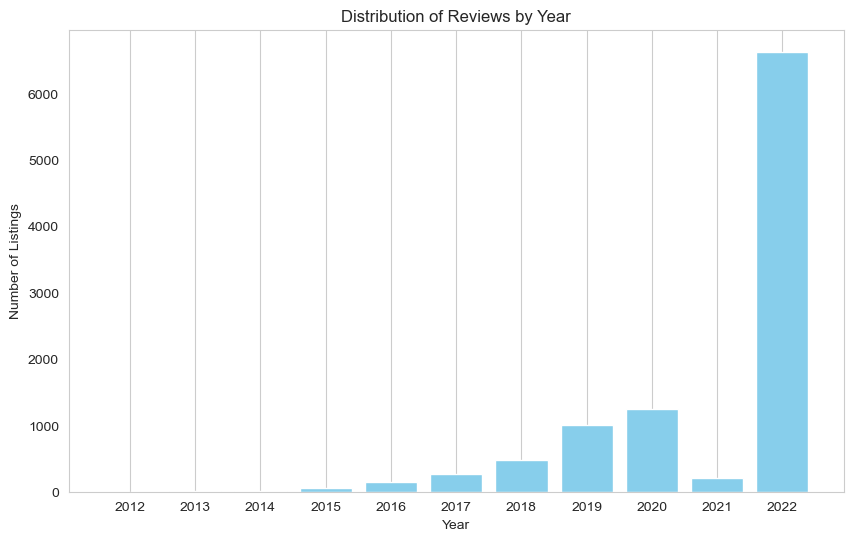

In [98]:
# Plot the distribution of reviews by year
plt.figure(figsize=(10, 6))
plt.bar(review_distribution.index, review_distribution.values, color='skyblue')
plt.title('Distribution of Reviews by Year')
plt.xlabel('Year')
plt.ylabel('Number of Listings')
plt.xticks(review_distribution.index)
plt.grid(axis='y')
plt.show()

Grafik di atas menunjukkan distribusi banyaknya review terakhir yang tercatat per tahun.
- Dari tahun 2012 hingga 2015, jumlah ulasan yang dicatat setiap tahun rendah dan stabil, menunjukkan pertumbuhan yang lambat dalam jumlah ulasan. Mulai tahun 2016, terlihat ada sedikit peningkatan jumlah ulasan setiap tahun, dengan peningkatan yang lebih jelas dari tahun 2019. Hal ini bisa menunjukkan peningkatan popularitas dari banyaknya host yang mendapatkan review dari user melalui platform.

- Tahun 2021 menunjukkan penurunan yang signifikan dalam jumlah ulasan dibandingkan tahun sebelumnya. Hal ini mungkin disebabkan oleh faktor eksternal yang memengaruhi aktivitas pengguna, seperti pandemi COVID-19 yang membatasi mobilitas atau perubahan kebijakan layanan yang disesuaikan dengan keadaan saat COVID-19.

- Tahun 2022 menunjukkan lonjakan yang sangat signifikan, dengan jumlah ulasan yang jauh lebih tinggi dibandingkan tahun-tahun sebelumnya. Ini mungkin menandakan adanya peningkatan besar dalam basis pengguna atau aktivitas layanan yang signifikan selama tahun tersebut.

- Secara keseluruhan, tren menunjukkan bahwa jumlah ulasan semakin meningkat dari tahun ke tahun, meskipun terdapat fluktuasi tertentu, dan puncaknya terjadi pada tahun 2022. Hal ini bisa menjadi indikator positif bagi layanan yang mendapatkan review, menunjukkan pertumbuhan dan peningkatan keterlibatan pengguna.

## **Kesimpulan dan Rekomendasi**

In [99]:
df.to_csv("Airbnb Listings Bangkok (cleaned).csv")